# About

This notebook is written for storing all reproducible codes for **spatial visulazation** and **cell-cell interaction** in main figures from article \<The spatial atlas of cholestatic injury and repair in mice\>

Author: Xinyi Shentu

Date: 2024-01-25

In [2]:
# Required packages
library("dplyr")
library("Seurat")
library("ggplot2")
library("patchwork")

Sys.setenv(TZ="Asia/Shanghai")

In [45]:
# Load spatial data
sp <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/sourceFiles/20220414_DDCspatial_merge_normalized_scaled_zonated_revised.rds")
meta <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20230323_first_revision_DDC/dataReady/20230621_DDC-SCST_NG_revision_Stereo-seq_22_slides_metadata_web_indexedCol.rds")

sp@meta.data <- meta[ rownames(sp@meta.data), ]

In [46]:
representative_slides <- c("DY1",  "FS1", "FS4", "FS5", "FR8", "GD4")
names(representative_slides) <- c("D0", "D8", "D17", "R2", "R7", "R21")

representative_slides

D0    D8   D17    R2    R7   R21 
"DY1" "FS1" "FS4" "FS5" "FR8" "GD4"

# Fig.1

## 1c

In [57]:
D17_local <- dplyr::filter( sp@meta.data, slide == representative_slides["D17"] & ( x>15 & x<87 ) & ( y>99 & y<171 ) )

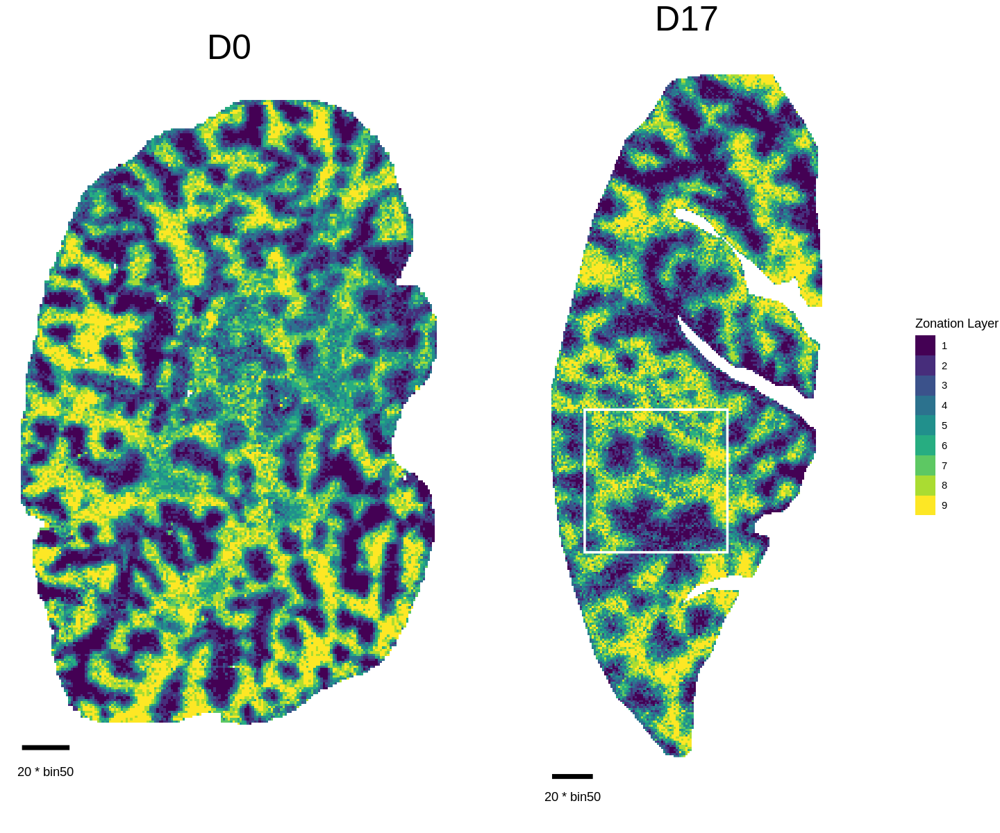

In [113]:
options(repr.plot.width = 12, repr.plot.height = 10)

pList <- list()

for ( s in c("D0", "D17") ) {
    pList[[s]] <- ggplot(dplyr::filter(sp@meta.data, slide == representative_slides[s]), aes(x, y)) +
        geom_raster(aes(fill = factor(rank))) + 
        scale_fill_manual(values = viridisLite::viridis(n = 9)) +
        coord_fixed() + theme_void() + 
        annotate("segment", x = 0, xend = 20, y = -10, yend = -10, size = 2, colour = "black") + 
        annotate("text", x = 10, y = -20, label = c("20 * bin50")) +
        labs(fill = "Zonation Layer", title = s) +
        theme(plot.title = element_text(size = 30, hjust = .5))
    
    if (s == "D17") {
        pList[[s]] <- pList[[s]] +
                        annotate(geom = "rect", 
                                 xmin = min(D17_local$x), xmax = max(D17_local$x), 
                                 ymin = min(D17_local$y), ymax = max(D17_local$y), 
                                 colour = "white", size = 1, fill = NA)
    }
}

ggpubr::ggarrange(plotlist = pList, common.legend = TRUE, legend = "right")

## 1d

In [66]:
# A pre-run RMagic result based on representative slides, used for data visualization
magic_result <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20230323_first_revision_DDC/Reanalyze_base_new_zonation/20230628_Magic_showed_genes_Fig1E.rds")

In [675]:
#' Spatial visualization for a specific gene on given region, based on RMagic result
#'
#' @param  gene A single gene name to visualize.
#' @param  obj A meta.data data.frame, storing the spatial bin to visualize.
#' @param  magic The magic_output$result.
#'
#' @export
MagicMeSub <- function (gene, obj, magic, lines = FALSE, nrow = 1, ncol = 6, 
    style = "complete", line_width = 0.8, facet=FALSE, rescale = FALSE) 
{
    require("ggplot2")
    times <- c("D0", "D8", "D17", "R2", "R7", "R21")
    rs <- c("DY1", "FS1", "FS4", "FS5", "FR8", "GD4")
    
    df <- filter(obj, slide %in% rs)[, c("x", "y", "time", "rank")]
    df$value <- magic[rownames(df), gene]
    df$x <- df$x - min(df$x)
    df$y <- df$y - min(df$y)
    
    if (rescale) {
        p <- df %>% ggplot(aes(x, y)) + geom_raster(aes(fill = scales::rescale(value)))
    } else {
        p <- df %>% ggplot(aes(x, y)) + geom_raster(aes(fill = value))
    }
    
    p <- p + 
        scale_fill_viridis_c(option = "B", direction = -1) + 
        annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black")
    
    if (lines) {
        if (style == "complete") {
            p <- p + 
                geom_contour(aes(z = rank), breaks = 5, color = "white", size = line_width + 1, 
                             lineend = "round", linejoin = "round") + 
                geom_contour(aes(z = rank), breaks = 5, color = "black", size = line_width, 
                             lineend = "round", linejoin = "round")
        }
        else {
            p <- p + 
                geom_contour(aes(z = rank), breaks = 5, color = "black", size = line_width, 
                             lineend = "round", linejoin = "round")
        }
    }
    p <- p + 
        annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") +
        annotate("text", x = 4, y = -15, label = c("4 * bin50")) + 
        coord_fixed() + theme_void() + 
        labs(fill = "Magic_value", title = gene)
    
    if (facet) {
        p <- p + 
            facet_wrap(~time, ncol = ncol, nrow = nrow) 
    }
    
    p <- p +
        theme(legend.position = "bottom", 
              plot.title = element_text(face = "italic", hjust = 0.5, size = 24)) + 
        guides(fill=guide_colorbar(ticks.colour = NA))
    
    return(p)
}

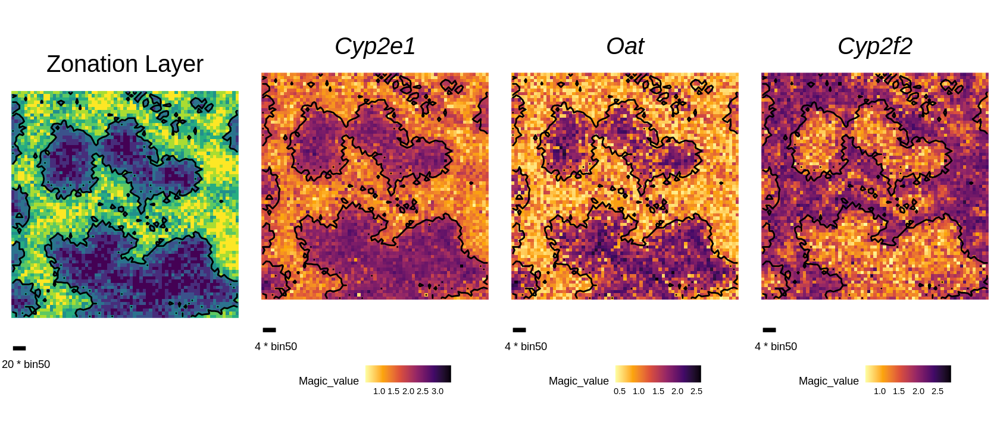

In [673]:
plist <- list()

# Zonation block
plist$zonation <- ggplot(D17_local, aes(x - min(x), y - min(y))) +
                geom_raster(aes(fill = factor(rank))) +
                scale_fill_manual(values = viridisLite::viridis(n = 9)) +
                geom_contour(aes(z = rank), breaks = 5, color = "black", size = 0.8, 
                             lineend = "round", linejoin = "round") +
                annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
                annotate("text", x = 4, y = -15, label = c("20 * bin50")) + 
                labs(fill = "Zonation Layer", title = "Zonation Layer") +
                coord_fixed() + theme_void() + 
                theme(plot.title = element_text(hjust = 0.5, size = 24)) + 
                guides(fill="none")

# Genes block
for ( g in c("Cyp2e1", "Oat", "Cyp2f2") ) {
    p <- MagicMeSub(g, D17_local, magic_result$result, lines = TRUE, style = "no")
    
    plist[[g]] <- p
}

options(repr.plot.width = 14, repr.plot.height = 6)
ggpubr::ggarrange(plotlist = plist, nrow = 1, common.legend = FALSE)

## 1e

In [3]:
spatialDomain_meta <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20230323_first_revision_DDC/dataReady/20230517_Niche_22_slides_meta_annotation_advanced_ed2.rds")

head(spatialDomain_meta, 3)

,orig.ident,nCount_RNA,nFeature_RNA,time,slide,lib,percent.mt,Cholniche,B_cell,LAM,⋯,DNA_damage,Inflammation,Fibrosis,annotation,annotation_macro,x,y,rank,rank_distance,display
,<fct>,<dbl>,<int>,<fct>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>
BIN.93_5,niche22slides,5913,1682,D0,DY1,Niche,1.234568,Other area,-0.008305227,-0.2341839,⋯,-0.1050565,-0.14789724,-0.2035674,Hepa-domain,Hepa-domain,92,261,4,-0.3070456,1
BIN.94_5,niche22slides,6659,1772,D0,DY1,Niche,1.486710,Other area,-0.016493705,-0.3364611,⋯,-0.1083980,-0.15128474,-0.2057190,Hepa-domain,Hepa-domain,93,261,4,-0.3742820,1
BIN.95_5,niche22slides,7495,1895,D0,DY1,Niche,1.494330,Other area,-0.013415794,-0.3539215,⋯,-0.1244256,-0.05924523,-0.1995001,Hepa-domain,Hepa-domain,94,261,3,-0.5472397,1


In [11]:
#' Square pane view selector on spatial
#'
#' @param  data A meta.data data.frame, storing the spatial bin to visualize.
#' @param  cx x of the pane center.
#' @param  cy y of the pane center.
#' @param  r Length of the square pane sides.
#'
#' @export
paneMaker <- function(data, cx, cy, r = 50, t = "", ifMul = TRUE) {
    if (ifMul) {
        tmp <- dplyr::filter(data, time == t & display == 1)
    }
    else {
        tmp <- data
    }
    
    tmp <- filter(tmp, x >= cx-(r/2-1) & x <= cx+(r/2))
    tmp <- filter(tmp, y >= cy-(r/2-1) & y <= cy+(r/2))
    
    return(tmp)
}

In [69]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(135, 156), `D8` = c(156, 130), `D17` = c(65, 175),
    `R2`= c(130, 240), `R7` = c(250, 210), `R21` = c(168, 135)
)

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(spatialDomain_meta, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        domain_local <- tmp
    } else {
        domain_local <- rbind(domain_local, tmp)
    }
}

In [222]:
p_list <- list()

lplc.palette <- c("#c67bff", "#7bad00", "#f9776d", "#00c5c9")
names(lplc.palette) <- c("Hepa-domain", "LPLC-domain", "Chol-domain", "Portal vein-area")

for ( t in c("D0", "D8", "D17", "R2", "R7", "R21") ) {
    tmp <- dplyr::filter(spatialDomain_meta, time == t & display == 1)
    tmp_local <- dplyr::filter(domain_local, time == t)
    
    p <- ggplot(tmp, aes(x, y)) +
        geom_raster(aes(fill = annotation_macro)) +
        geom_contour(aes(z = rank), breaks = 5, color = "black", size = 0.4) +
        scale_fill_manual(values = lplc.palette) +
        coord_fixed() + theme_void() +
        annotate("segment", x = -20, xend = 0, y = 15, yend = 15, size = 2,colour = "black") + 
        annotate("text", x = 10-20, y = 26, label = "20 * bin50") + 
        annotate("rect", 
                 xmin = min(tmp_local$x), xmax = max(tmp_local$x), 
                 ymin = min(tmp_local$y), ymax = max(tmp_local$y), 
                 size = 1, colour = "white", fill = NA) +
        labs(fill = "", title = t) + 
        theme(plot.title = element_text(size = 24, hjust = 0.5))
    
    p_list[[t]] <- p
}

options(warn = -1)
p1 <- ggpubr::ggarrange(plotlist = p_list, ncol = 6, nrow = 1, common.legend = TRUE, legend = "top")
options(warn = 0)

In [129]:
lplc.palette <- c("#c67bff", "#7bad00", "#f9776d", "#00c5c9")
names(lplc.palette) <- c("Hepa-domain", "LPLC-domain", "Chol-domain", "Portal vein-area")

p2 <- ggplot(domain_local, aes(px, py)) +
    geom_raster(aes(fill = annotation_macro)) +
    scale_fill_manual(values = lplc.palette) +
    coord_fixed() + theme_void() +
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2,colour = "black") + 
    annotate("text", x = 10, y = -10, label = c("4 * bin50")) + 
    facet_wrap(~time, nrow = 1, ncol = 6) +
    theme(legend.position = "bottom", strip.text = element_text(size = 18))

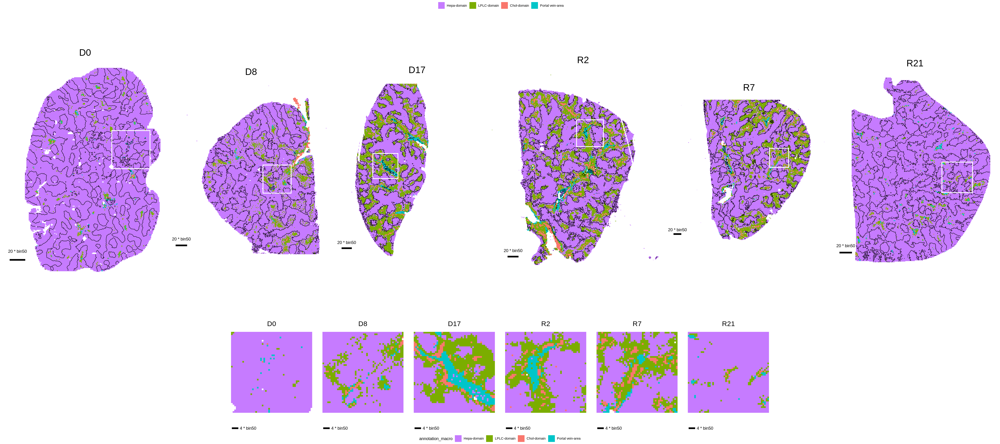

In [130]:
library("patchwork")
options(repr.plot.width = 36, repr.plot.height = 16)
p1 / p2 + plot_layout(heights = c(3, 1))

## 1f

In [133]:
index_slide <- spatialDomain_meta[, c("time", "slide")] %>% unique
rownames(index_slide) <- index_slide$slide

stat <- spatialDomain_meta[, c("slide", "annotation_macro")] %>% table %>% unclass %>% as.data.frame
stat$slide <- rownames(stat)
stat$time <- index_slide[ stat$slide, "time"]
stat <- reshape2::melt(stat)

colnames(stat) <- c("slide", "time", "domain", "value")
stat <- filter(stat, domain %in% c("Hepa-domain", "LPLC-domain", "Chol-domain"))

 head(stat, n = 3)

Using slide, time as id variables



,slide,time,domain,value
,<chr>,<fct>,<fct>,<int>
1,DT2,D0,Hepa-domain,42278
2,DY1,D0,Hepa-domain,35836
3,FR1,D8,Hepa-domain,45619


In [135]:
df <- stat %>% group_by(slide) %>% 
summarize(time = time, 
          domain = domain, 
          ratio_on_slide = value / sum(value)) %>% 
as.data.frame()

df$time_domain <- paste0(df$time, "_", df$domain)

df <- df %>% group_by(time_domain) %>% 
summarize( slide = slide, time = time, domain = domain, ratio_on_slide = ratio_on_slide, 
          ratio_on_slide_mean = mean(ratio_on_slide),
          ratio_on_slide_sem = sd(ratio_on_slide) / sqrt(length(ratio_on_slide))
         ) %>% 
as.data.frame()

 head(df, n = 3)

`summarise()` has grouped output by 'slide'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'time_domain'. You can override using the `.groups` argument.


,time_domain,slide,time,domain,ratio_on_slide,ratio_on_slide_mean,ratio_on_slide_sem
,<chr>,<chr>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
1,D0_Chol-domain,DT2,D0,Chol-domain,0.001769243,0.001418415,0.0003508285
2,D0_Chol-domain,DY1,D0,Chol-domain,0.001067586,0.001418415,0.0003508285
3,D0_Hepa-domain,DT2,D0,Hepa-domain,0.997334340,0.989154701,0.0081796388


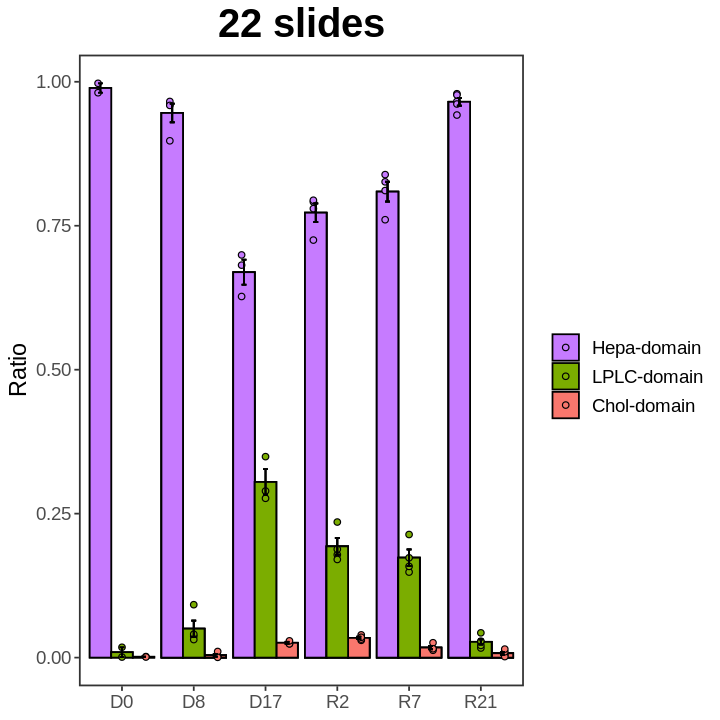

In [139]:
lplc.palette <- c("#c67bff", "#7bad00", "#f9776d")

p <- ggplot(df, aes(x = time, y = ratio_on_slide_mean, fill = domain)) +
    geom_bar(stat = "identity", color = "black", position = position_dodge()) +
    geom_point(aes(y = ratio_on_slide,fill = domain),
               position = position_jitterdodge(jitter.width = .0, dodge.width = 1), 
               pch = 21) +
    geom_errorbar(aes(ymin = ratio_on_slide_mean - ratio_on_slide_sem, 
                      ymax = ratio_on_slide_mean + ratio_on_slide_sem), 
                  stat = "identity", width = .2, position = position_dodge(.9)) +
    scale_fill_manual(values = lplc.palette) +
    labs(x = NULL, y = "Ratio", fill = NULL, title = "22 slides") +
    theme_bw(base_rect_size = 1) +
    scale_y_continuous( breaks = c(0, .25, .5, .75, 1., 1.2)) +
    theme(panel.grid = element_blank(), 
          text = element_text(size = 14), 
          plot.title = element_text(size = 24, face = "bold", hjust = .5))

options(repr.plot.width = 6, repr.plot.height = 6)
p

## 1h

In [140]:
# Load RCTD output results, the spacexr::RCTD processing is explained detailedly in CIRSTA_Spatial_Transcriptomic_Analysis.ipynb
rctd_D0 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221024_LyEC_RCTD/rctd/20221024_rctd_LyEC_D0.rds")
rctd_D17 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221024_LyEC_RCTD/rctd/20221024_rctd_LyEC_D17.rds")

In [144]:
str(rctd_D0, 2)
str(rctd_D17, 2)

Formal class 'RCTD' [package "spacexr"] with 9 slots
  ..@ spatialRNA        :Formal class 'SpatialRNA' [package "spacexr"] with 3 slots
  ..@ originalSpatialRNA:Formal class 'SpatialRNA' [package "spacexr"] with 3 slots
  ..@ reference         :Formal class 'Reference' [package "spacexr"] with 3 slots
  ..@ config            :List of 21
  ..@ cell_type_info    :List of 2
  ..@ internal_vars     :List of 8
  ..@ results           :List of 4
  ..@ de_results        : list()
  ..@ internal_vars_de  : list()
Formal class 'RCTD' [package "spacexr"] with 9 slots
  ..@ spatialRNA        :Formal class 'SpatialRNA' [package "spacexr"] with 3 slots
  ..@ originalSpatialRNA:Formal class 'SpatialRNA' [package "spacexr"] with 3 slots
  ..@ reference         :Formal class 'Reference' [package "spacexr"] with 3 slots
  ..@ config            :List of 21
  ..@ cell_type_info    :List of 2
  ..@ internal_vars     :List of 8
  ..@ results           :List of 4
  ..@ de_results        : list()
  ..@ inter

In [49]:
RCTD_preprocessor <- function(RCTD_result, mask) {
    
    # `mask` is the cell types which were not show on spatial
    mask_default <- c("Endo")
    if (missing(mask)) {
        mask = mask_default
    } else {
        mask = c(mask_default, mask)
    }
    
    # The dependency functions
    ## FUNCTION: Extract weights Matrix from a given RCTD_result
    extractWeight <- function(dat) {
        return(Matrix::Matrix(RCTD_result@results$weights, sparse = TRUE))
    }
    ## FUNCTION: K-Means filter by celltype for weights Matrix, to judge if a celltype in a spatial bin50
    kmeanFilter <- function(weights, cores = 2, nn = 1) {
        kmFilter_results <- apply(weights, 2, function(x) {
            x_kmeans <- kmeans(x = x, centers = cores)
            res <- x_kmeans$cluster; name <- names(res)
            
            toRestore <- head(x = order(x_kmeans$centers, decreasing = TRUE), n = nn)
            res <- as.integer(res %in% toRestore)
            names(res) <- name
            return(res)
        })
        
        return(as.data.frame(kmFilter_results))
    }
    

    weights.df <- extractWeight(RCTD_result)
    
    kmeans.df1 <- kmeanFilter(weights.df)
    ## For HSC celltype, we apply 4 cores in k-means and take 2 biggest clusters
    kmeans.df2 <- kmeanFilter(weights.df, cores = 4, nn = 2)
    kmeans.df <- kmeans.df1; kmeans.df[, "HSC"] <- kmeans.df2[ rownames(kmeans.df), "HSC"]
    
    npc_rank <- apply(kmeans.df, 2, sum) %>%
        sort(decreasing = TRUE) %>%
        names()
    npc_rank <- npc_rank[!npc_rank %in% mask]
    
    # Generate data.frame restoring spatial bins coordinates and cell type
    for (i in npc_rank) {
        if (i == npc_rank[1]) {
            tmp.df <- cbind(RCTD_result@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], 
                            weights.df[kmeans.df[, i] == 1, i], 
                            i)
            tmp.df <- cbind(tmp.df, bin = rownames(tmp.df))
            rownames(tmp.df) <- NULL
        } else {
            tmp2.df <- cbind(RCTD_result@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], weights.df[kmeans.df[, i] == 1, i], i)
            tmp2.df <- cbind(tmp2.df, bin = rownames(tmp2.df))
            tmp.df <- rbind(tmp.df, tmp2.df)
        }
    }
    
    colnames(tmp.df) <- c("x", "y", "weights", "type", "bin")
    tmp.df$size <- 1
    tmp.df$size[which(tmp.df$type == "KC")] <- 0.1
    tmp.df$x <- tmp.df$x - min(tmp.df$x)
    tmp.df$y <- tmp.df$y - min(tmp.df$y)
    

    coords <- RCTD_result@spatialRNA@coords
    coords$x <- coords$x - min(coords$x)
    coords$y <- coords$y - min(coords$y)

    LPLC_cor <- coords[weights.df[kmeans.df$LPLC == 1, "LPLC"][weights.df[kmeans.df$LPLC == 1, "LPLC"] >= median(weights.df[kmeans.df$LPLC ==
            1, "LPLC"])] %>% names(), ]

    return(list(npc.df = tmp.df, coor = coords, LPLC_cor = LPLC_cor))
}

In [208]:
visualized_celltype <- c("Cholangiocyte", "KC", "LAM", "Monocyte", "T cell", "B cell", "Neutrophil", "Hep")
pal <- c('#ffef00','#00a120','#c8509b','#8d278a','#2c2c2c','#073290','#d90e11','#ce9178')
names(pal) <- visualized_celltype

rctded_D17 <- RCTD_preprocessor(RCTD_result = rctd_D17)

# Exchange the x, y axis
for ( i in names(rctded_D17) ) {
    rctded_D17[[i]][, c("x", "y")] <- rctded_D17[[i]][, c("y", "x")]
}

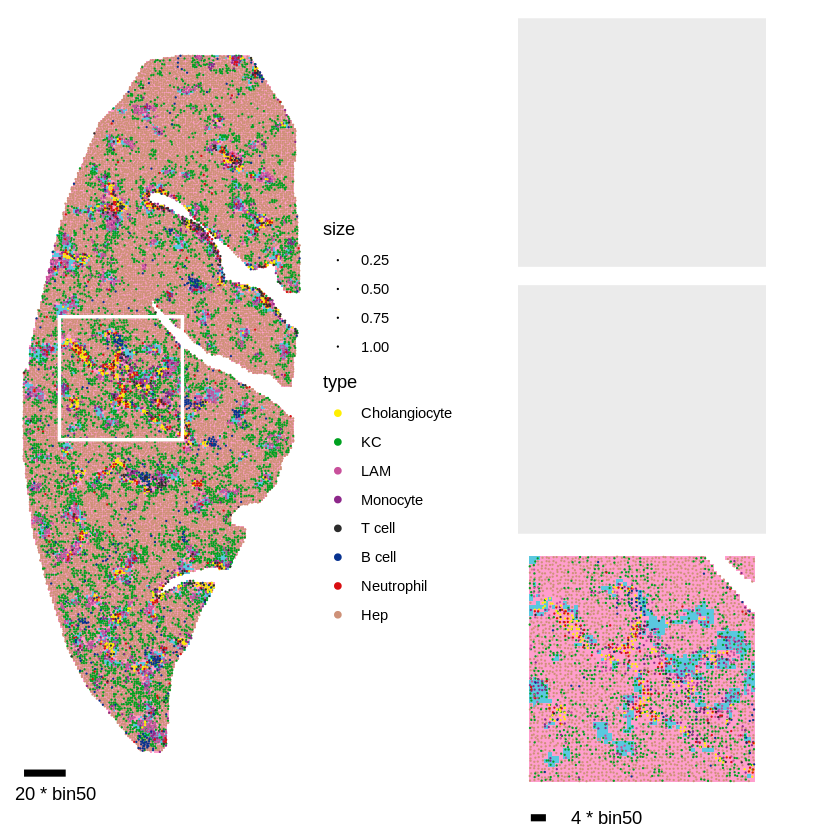

In [262]:
# D17 rctd downstreaming output
npc_df <- dplyr::filter(rctded_D17$npc.df, type %in% visualized_celltype)
coor <- rctded_D17$coor
LPLC_cor <- rctded_D17$LPLC_cor

# D17 local panel view
local_coor <- paneMaker(data = coor, 46, 179,  60, ifMul = FALSE)
local_LPLC_cor <- LPLC_cor[ rownames(local_coor), ]
local_npc_df <- dplyr::filter(npc_df, bin %in% rownames(local_coor))


## Plot global map
{
    # Tissue
    p <- ggplot(coor, aes(x = x, y = y)) + geom_raster(fill = "#ff9ecd") + coord_fixed()
    # LPLC
    p <- p + geom_raster(data = LPLC_cor, mapping = aes(x, y), fill = "#5ac8df", show.legend = FALSE)

    # NPC
    p <- p + 
        geom_point(data = npc_df, 
                   mapping = aes(x, y, color = type, size = size), 
                   position = position_jitter(h = 0.3, w = 0.3),
                   show.legend = TRUE
                  ) +
        scale_size_area(max_size = 0.005) +
        scale_color_manual(values = pal)

    # label
    p <- p +
            annotate("segment", x = 0, xend = 20, y = -10, yend = -10, size = 2, colour = "black") + 
            annotate("text", x = 15, y = -20, label = c("20 * bin50")) + 
        annotate(geom = "rect", 
                     xmin = min(local_coor$x), xmax = max(local_coor$x), 
                     ymin = min(local_coor$y), ymax = max(local_coor$y), 
                     colour = "white", size = 1, fill = NA) +
            theme_void()
}
p_D17_global <- p


## Plot local map
{
    # Tissue
    p <- ggplot(local_coor, aes(x = x, y = y)) + geom_raster(fill = "#ff9ecd") + coord_fixed()
    # LPLC
    p <- p + geom_raster(data = local_LPLC_cor, mapping = aes(x, y), fill = "#5ac8df", show.legend = FALSE)
    # NPC
    p <- p + 
        geom_point(data = local_npc_df, 
                   mapping = aes(x, y, color = type, size = size), 
                   position = position_jitter(h = 0.3, w = 0.3),
                   show.legend = FALSE
                  ) +
        scale_size_area(max_size = 0.005) +
        scale_color_manual(values = pal)
    
    # label
    p <- p +
            annotate("segment", x = min(local_coor$x) + 0, xend = min(local_coor$x) + 4, 
                     y = min(local_coor$y) -10, yend = min(local_coor$y)-10, 
                     size = 2, colour = "black") + 
            annotate("text", x = min(local_coor$x) + 20, y = min(local_coor$y) -10, label = c("4 * bin50")) + 
            theme_void()
}
p_D17_local <- p

p <- p_D17_global + ( ggplot() /  ggplot() / p_D17_local)

options(repr.plot.width = 7, repr.plot.height = 7)
options(warn = -1)
p
options(warn = 0)

## 1i

In [187]:
union_celltype <- c( rctd_D0@cell_type_info$info[[2]], rctd_D17@cell_type_info$info[[2]]) %>% unique()

for ( t in c("D0", "D17") ) {
    counts <- RCTD_preprocessor(RCTD_result = get(paste0("rctd_", t)))$npc.df
    counts$rank <- meta[ counts$bin, "rank"];
    
    tmp_result <- counts[, c("type", "rank")] %>% table %>% unclass %>% as.data.frame
    colnames(tmp_result) <- paste0(t, "_", colnames(tmp_result))

    for ( x in union_celltype ) {
        if (!x %in% rownames(tmp_result)) {
            tmp_result[x, ] <- 0
        }
    }
    
    if (t == "D0") {
        result <- tmp_result
        result[ c("LPLC", "LAM"),] <- NA
    } else {
        result <- cbind(result, tmp_result)
    }
}

result <- result[ c("LPLC", "Cholangiocyte", "PC_LVEC", "PP_LVEC", "LSEC", "LyEC", 
                    "Fibroblast", "HSC", "VSMC", "KC", "LAM", "Monocyte", "T cell", 
                    "ILC1", "NK", "B cell", "Neutrophil", "pDC", "cDC"),]
annot_col <- data.frame(time = gsub("_[0-9]*$", "", colnames(result)), row.names = colnames(result))
ann_colors <- list(time = viridisLite::viridis(n = 6)[c(1, 3)])
names(ann_colors$time) <- c("D0", "D17")

In [198]:
result

,D0_1,D0_2,D0_3,D0_4,D0_5,D0_6,D0_7,D0_8,D0_9,D17_1,D17_2,D17_3,D17_4,D17_5,D17_6,D17_7,D17_8,D17_9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
LPLC,NA,NA,NA,NA,NA,NA,NA,NA,NA,0,1,6,37,211,645,1120,1613,2186
Cholangiocyte,1,4,4,6,12,17,16,17,63,0,0,1,6,25,62,117,218,378
PC_LVEC,1121,831,744,612,568,458,395,434,400,521,435,323,300,239,198,210,183,172
PP_LVEC,539,489,516,549,617,702,697,893,1063,273,258,234,227,278,305,344,362,425
LSEC,1138,1250,1278,1302,1249,1208,1170,1133,1003,449,516,542,550,468,460,371,316,268
LyEC,336,284,288,294,305,333,317,314,421,119,144,128,164,240,260,296,301,363
Fibroblast,2,5,4,9,7,14,22,32,91,0,1,11,39,127,206,269,284,313
HSC,2108,1891,1828,1657,1593,1484,1491,1505,1599,458,451,465,484,705,881,1021,1228,1420
VSMC,0,0,0,0,0,0,0,0,0,0,3,3,11,11,34,46,61,86


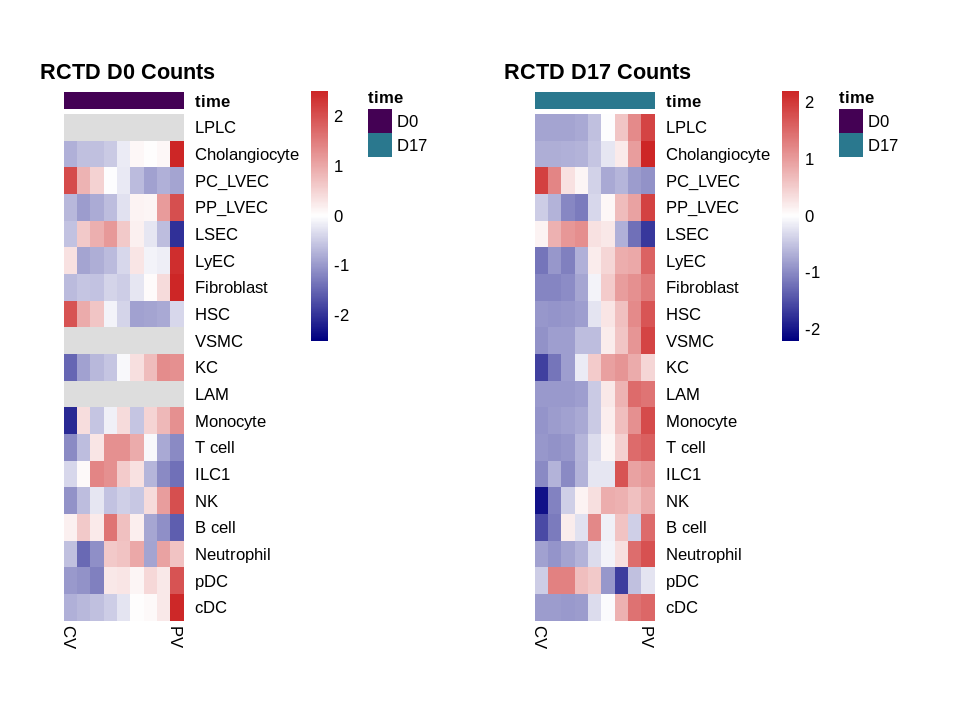

In [195]:
p1 <- pheatmap::pheatmap(mat = result[, grep("D0_", colnames(result))], silent = TRUE,
                         cluster_cols = FALSE, cluster_rows = FALSE, 
                         scale = "row", 
                         cellheight = 16, cellwidth = 8, 
                         fontsize = 10, 
                         labels_col = rep(c("CV", rep("", 7),"PV"), 1), 
                         annotation_col = annot_col, gaps_col = 9, 
                         annotation_colors = ann_colors,
                         color = colorRampPalette(c("navy", "white", "firebrick3"))(200), 
                         border_color = NA, 
                         main = "RCTD D0 Counts") %>% ggplotify::as.ggplot()
p2 <- pheatmap::pheatmap(mat = result[, grep("D17_", colnames(result))], 
                         cluster_cols = FALSE, cluster_rows = FALSE, silent = TRUE,
                         scale = "row", 
                         cellheight = 16, cellwidth = 8, 
                         fontsize = 10, 
                         labels_col = rep(c("CV", rep("", 7),"PV"), 1), 
                         annotation_col = annot_col, gaps_col = 9, 
                         annotation_colors = ann_colors,
                         color = colorRampPalette(c("navy", "white", "firebrick3"))(200), 
                         border_color = NA, 
                         main = "RCTD D17 Counts") %>% ggplotify::as.ggplot()

options(repr.plot.width = 8, repr.plot.height = 6)
p1 + p2

# Fig.2

## 2c

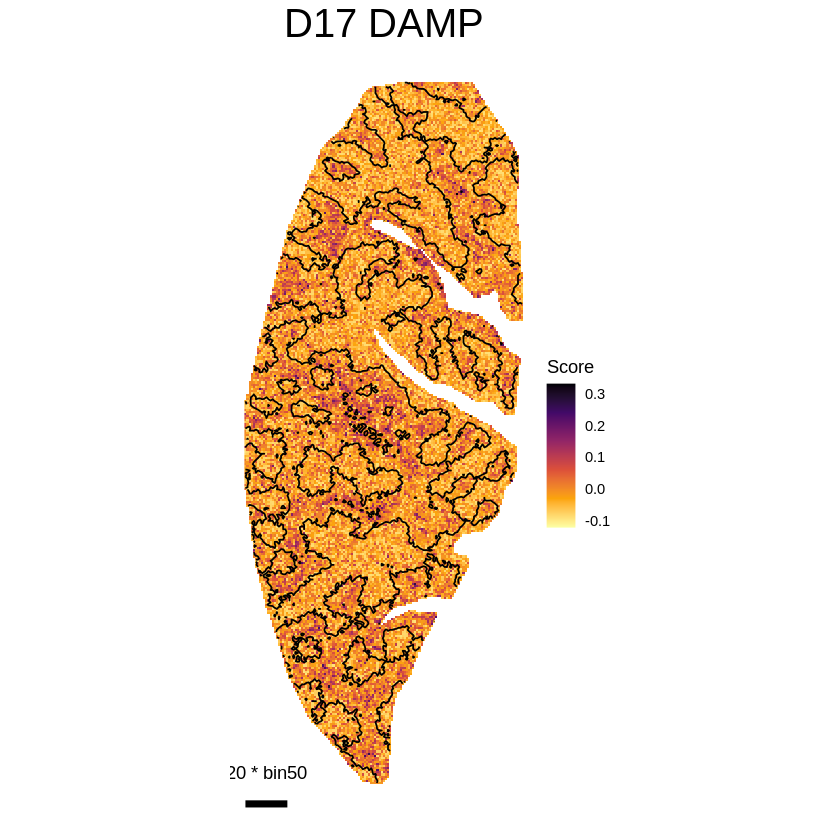

In [266]:
path_DAMP_df <- dplyr::filter(sp@meta.data, slide == representative_slides[["D17"]])

p_DAMP_D17 <- ggplot(path_DAMP_df, aes(x, y)) +
        geom_raster(aes(fill = DAMP)) +
        scale_fill_viridis_c(option = "B", direction = -1) +
        geom_contour(aes(z = rank), breaks = 5, color = "black", size = .5) +
        annotate("segment", x = 0, xend = 20, y = -10, yend = -10, size = 2, colour = "black") + 
        annotate("text", x = 10, y = 5, label = c("20 * bin50")) +
        labs(title = "D17 DAMP", fill = "Score") +
        coord_fixed() + theme_void() +
        theme(plot.title = element_text(hjust = 0.5, size = 24)) +
        guides(fill = guide_colorbar(ticks.colour = NA, ))

p_DAMP_D17

In [296]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(134, 56), `D8` = c(126, 73), `D17` = c(51, 144),
    `R2`= c(153, 181), `R7` = c(182, 163), `R21` = c(87, 180)
)

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(temp_data, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        spatial_local <- tmp
    } else {
        spatial_local <- rbind(spatial_local, tmp)
    }
}

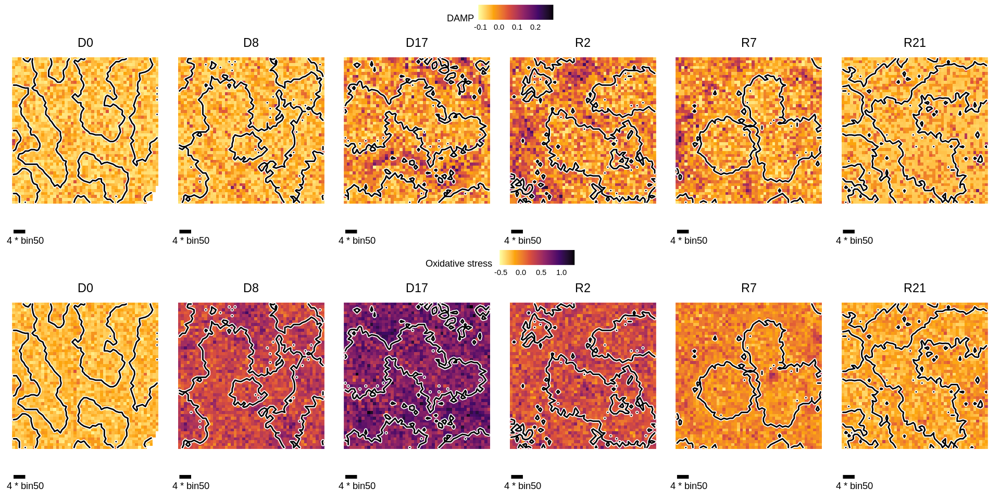

In [307]:
pList <- list()
for (path in c("DAMP", "Oxidative_stress")) {
    p <- ggplot(spatial_local, aes(px, py)) +
    geom_raster(aes_string(fill = path)) +
    scale_fill_viridis_c(option = "B", direction = -1) +
    geom_contour(aes(z = rank), breaks = 5, color = "white", size = 1.8, lineend = "round", linejoin = "round") + 
    geom_contour(aes(z = rank), breaks = 5, color = "black", size = .8, lineend = "round", linejoin = "round") + 
    labs(fill = gsub("_", " ", path)) +
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
    annotate("text", x = 4, y = -13, label = c("4 * bin50")) +
    coord_fixed() + theme_void() +
    facet_wrap(~time, ncol = 6) +
    theme(legend.position = "top", legend.direction = "horizontal", plot.title = element_text(size = 16), strip.text = element_text(size = 14)) +
    guides(fill = guide_colorbar(ticks.colour = NA))
    
    pList[[path]] <- p
}

# Show the result
options(repr.plot.width = 16, repr.plot.height = 8)
pList[[1]] / pList[[2]]

## 2e

In [315]:
zonation_statistician <- function(data, features) {
    if (class(data) == 'Seurat') {
        print("Input is a SeuratObj")
        df <- data@meta.data
    } else {
        df <- data
    }
    
    times <- c("D0", "D8", "D17", "R2", "R7", "R21")
    df$is <- paste0(df$time, "_layer_", df$rank)
    df$is <- factor(df$is, 
                    levels = paste0(rep(times[ times %in% unique(df$time) ], each = 9), 
                                    "_layer_", 
                                    rep(c(1:9), times = length(unique(df$time)))
                                   )
                   )
    
    fs <- features
    
    df <- df[, c("is", fs)] %>% group_by(is) %>% summarise_all(.funs = mean) %>% as.data.frame()
    rownames(df) <- df$is; df$is <- NULL
    df <- t(df)
    
    anno_col <- data.frame(time = gsub("_layer_[0-9]$", "", colnames(df)))
    rownames(anno_col) <- colnames(df)
    anno_col$time <- factor(anno_col$time, levels = times)
    
    return(list(df = df, anno_col = anno_col))
}

In [323]:
zonation_statheatmap <- function(data, title = "heatmap") {
    times <- c("D0", "D8", "D17", "R2", "R7", "R21")
    
    ann_col_colors <- list(time = viridisLite::viridis(n = 6))
    names(ann_col_colors$time) <- times
    
    p <- pheatmap::pheatmap(mat = data$df, silent = TRUE,
                            cluster_rows = FALSE, cluster_cols = FALSE, scale = "row", 
                            annotation_col = data$anno_col, 
                            annotation_colors = ann_col_colors,
                            angle_col = 90,
                            gaps_col = c(1:length(unique(data$anno_col$time))) * 9,
                            labels_col = rep(c("CV", rep("", 7),"PV"), length(unique(data$anno_col$time))), 
                            color = colorRampPalette(c("navy", "white", "firebrick3"))(200), 
                            border_color = NA,
                            cellheight = 16, cellwidth = 6, 
                            main = title
                           )
    return(p)
}

[1] "Input is a SeuratObj"


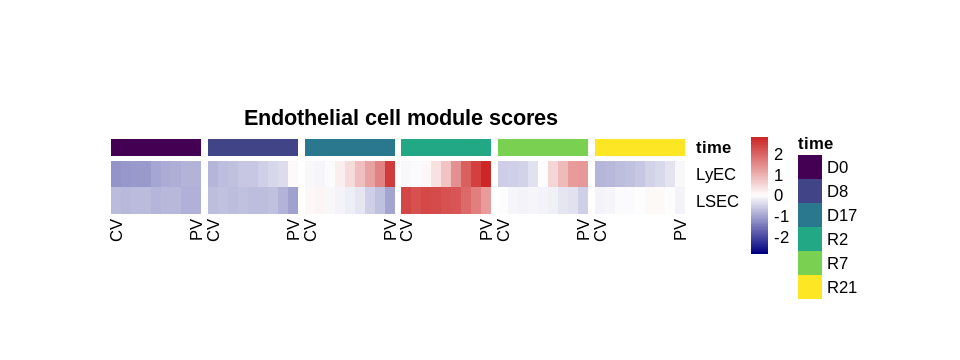

In [328]:
options(repr.plot.width = 8, repr.plot.height = 3)
zonation_statheatmap(data = zonation_statistician(data = sp, features = c("LyEC", "LSEC")), 
                     title = "Endothelial cell module scores")

## 2h

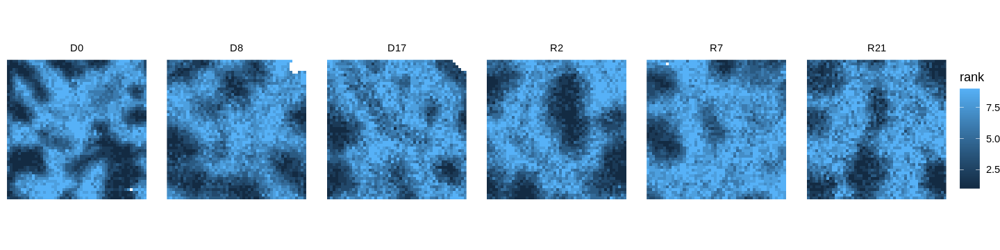

In [47]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(69, 45), `D8` = c(124, 120), `D17` = c(51, 174),
    `R2`= c(165, 198), `R7` = c(174, 205), `R21` = c(145, 169)
)

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(temp_data, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    
    if ( i == "D17" ) {
        tmp[, c("x", "y")] <- tmp[, c("y", "x")]
    }
    
    if ( i == "R2" ) {
        # Rotate 90 degree as showed in the main figure
        tmp[, c("x", "y")] <- tmp[, c("y", "x")]
        tmp$x <- -tmp$x
    }
    if ( i == "R21" ) {
        # Rotate 90 degree and flip vertically as showed in the main figure
        tmp[, c("x", "y")] <- tmp[, c("y", "x")]
        tmp$y <- -tmp$y
    }
    
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        spatial_local <- tmp
    } else {
        spatial_local <- rbind(spatial_local, tmp)
    }
}

options(repr.plot.width = 12, repr.plot.height = 3)
ggplot(spatial_local, aes(px, py)) + 
geom_raster(aes(fill = rank)) + 
coord_fixed() + theme_void() + 
facet_wrap(vars(time), ncol = 6, nrow = 1)

In [50]:
rctd_filePath <- "/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221024_LyEC_RCTD/rctd"
rctded_results <- list()

for (f in list.files(rctd_filePath) ) {
    rctded_results[[gsub("20221024_rctd_LyEC_|[.rds]", "", f)]] <- RCTD_preprocessor(RCTD_result = readRDS(paste0(rctd_filePath, "/", f)))
}

In [597]:
# Merged the rctd global cell distribution informations on representative slides
for ( t in names(rctded_results) ) {
    if ( t == "D0" ) {
        merged_npcdf <- rctded_results[[t]]$npc.df
        merged_LPLC <- rctded_results[[t]]$LPLC_cor
    } else {
        merged_npcdf <- rbind(merged_npcdf, rctded_results[[t]]$npc.df)
        merged_LPLC <- rbind(merged_LPLC, rctded_results[[t]]$LPLC_cor)
    }
}

merged_npcdf$time <- sp@meta.data[ merged_npcdf$bin, "time"]
merged_LPLC$time <- sp@meta.data[ rownames(merged_LPLC), "time"]

In [52]:
# Plotting block

pal <- c(Cholangiocyte = "#ffef00", LyEC = "#03a222",
         HSC = "#03a222", Fibroblast = "#2a4e9f", VSMC = "#cdd788", 
         Monocyte = "#03a222", LAM = "#2a4e9f", KC = "#cdd788",
         PP_LVEC = "#1677d2", PC_LVEC = "#d90e11", LSEC = "#1ae13c",
         cDC = "#d90e11", `T cell` = "#03a222", Neutrophil = "#d90e11")

p1_List <- list()
p2_List <- list()
p3_List <- list()
p4_List <- list()

for ( t in c("D0", "D8", "D17", "R2", "R7", "R21") ) {
    coords <- dplyr::filter(spatial_local, time == t)
    coords[, c("x", "y")] <- coords[, c("px", "py")]
    ix <- rownames(coords)
    
    ref <- dplyr::filter(merged_npcdf, time == t & bin %in% ix)
    ref[, c("x", "y")] <- coords[ ref$bin, c("x", "y")]
    
    # LAM is excluded at D0, because it is a celltype emerging under injury.
    # The reason why LAM to be here, is for the sake of the scRNA reference introducing this LAM annotation.
    # Same the reason as for LPLC at D0.
    if ( t == "D0" ) {
        ref <- filter(ref, type != "LAM")
    }
    
    LPLC <- dplyr::filter(merged_LPLC, time == t)
    LPLC <- LPLC[ rownames(LPLC) %in% ix,]
    LPLC[, c("x", "y")] <- coords[ rownames(LPLC), c("x", "y")]
    
    # Plot Hep area
    p <- ggplot(coords, aes(x, y)) + geom_raster(fill = "#ff9ecd") + coord_fixed()
    
    # Plot LPLC area
    if ( t != "D0" ) {
        p <- p + geom_raster(data = LPLC, aes(x, y), fill = "#5ac8df")
    }
    p <- p + labs(title = t)
    
    # Plot cell dot
    required_types <- list(
        p1 = c("Cholangiocyte", "Monocyte", "LAM"),
        p2 = c("Cholangiocyte", "Neutrophil"),
        p3 = c("Cholangiocyte", "Fibroblast"),
        p4 = c("Cholangiocyte", "LyEC", "LAM")
    )
    
    for ( rt in names(required_types) ) {
        tmp <- p +
        geom_point(
            data = ref[ref$type %in% required_types[[rt]],], 
            aes(x = x, y = y, color = type, size = size), 
            position = position_jitter(h = 0.3, w = 0.3),
            show.legend = TRUE) + 
        scale_size_area(max_size = 0.1) +
        scale_color_manual(values = pal[ names(pal) %in% required_types[[rt]] ]) + 
        annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
        annotate("text", x = 15, y = -10, label = c("4 * bin50")) + 
        theme_void() + 
        theme(plot.title = element_text(hjust = .5))

        tlist <- get(paste0(rt, "_List"))
        tlist[[t]] <- tmp
        assign(x = paste0(rt, "_List"), value = tlist)
    }
}

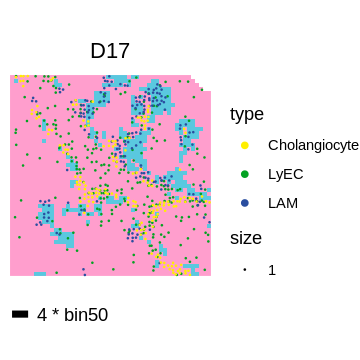

In [638]:
# Show the result
options(repr.plot.width = 3, repr.plot.height = 3)
options(warn = -1)
p4_List$D17
options(warn = 0)

## 2j

In [44]:
# Load magic LxR data
magic_lr <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220322_spatial_LR_diff/20220322_spatial_LR_magic_multipled.rds")

In [656]:
MagicMeSubLR <- function (LR, obj, magic, lines = FALSE, nrow = 1, ncol = 6, 
    style = "complete", line_width = 0.8, facet=FALSE, rescale = FALSE) 
{
    require(ggplot2)
    times <- c("D0", "D8", "D17", "R2", "R7", "R21")
    df <- filter(obj, display == 1)[, c("x", "y", 
        "time", "rank")]
    colnames(df) <- c("x", "y", "time", "rank")
    df$value <- magic$matrix[rownames(df), LR]
    
    if (rescale) {
        p <- df %>% ggplot(aes(x, y)) + geom_raster(aes(fill = scales::rescale(value)))
    } else {
        p <- df %>% ggplot(aes(x, y)) + geom_raster(aes(fill = value))
    }
    
    p <- p + 
        scale_fill_viridis_c(option = "B", direction = -1) + 
        annotate("segment", x = 0, xend = 4, y = -10, yend = -10, 
            size = 2, colour = "black") + annotate("text", x = 4, 
        y = -15, label = c("4 * bin50"))
    
    if (lines) {
        if (style == "complete") {
            p <- p + geom_contour(aes(z = rank), breaks = 5, 
                color = "white", size = line_width + 1, lineend = "round", 
                linejoin = "round") + geom_contour(aes(z = rank), 
                breaks = 5, color = "black", size = line_width, 
                lineend = "round", linejoin = "round")
        }
        else {
            p <- p + geom_contour(aes(z = rank), breaks = 5, 
                color = "black", size = line_width, lineend = "round", 
                linejoin = "round")
        }
    }
    p <- p + annotate("segment", x = 0, xend = 4, y = -10, yend = -10, 
        size = 2, colour = "black") + annotate("text", x = 4, 
        y = -15, label = c("4 * bin50")) + theme_void() + coord_fixed() + 
        labs(fill = LR, title = gsub("_", " - ", LR))
    
    if (facet) {
        p <- p + 
        facet_wrap(~time, ncol = ncol, nrow = nrow) 
    }
    
    p <- p +
        theme(legend.position = "bottom", plot.title = element_text(face = "italic", hjust = 0.5, size = 24), strip.text = element_text(size = 14)) +
    guides(fill=guide_colorbar(ticks.colour = NA))
    
    return(p)
}

In [654]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(134, 56), `D8` = c(126, 73), `D17` = c(51, 144),
    `R2`= c(153, 181), `R7` = c(182, 163), `R21` = c(87, 180)
)

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(temp_data, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        lr_local <- tmp
    } else {
        lr_local <- rbind(lr_local, tmp)
    }
}

lr_local$display <- 1
lr_local[, c("x", "y")] <- lr_local[, c("px", "py")]

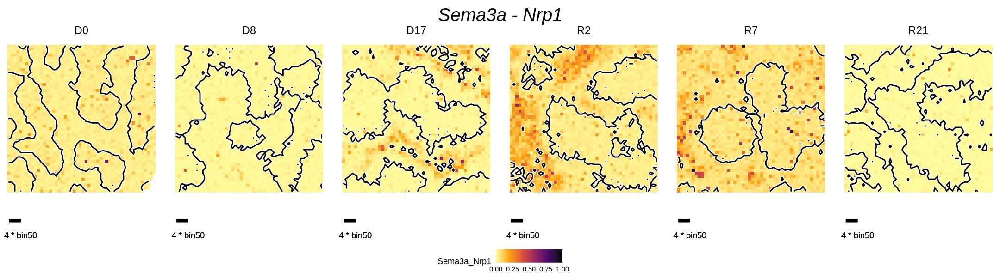

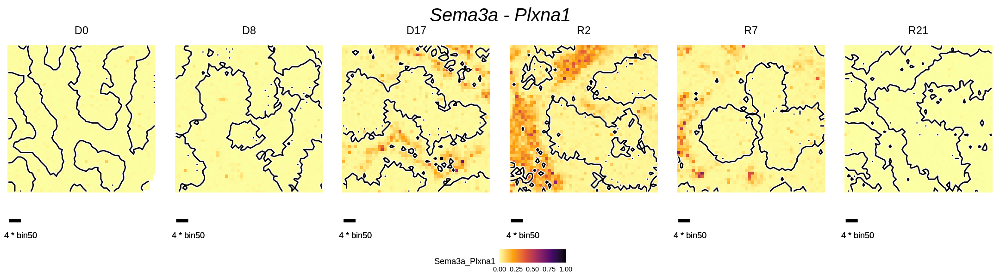

In [664]:
selected_LR <- strsplit(c("Sema3a_Nrp1", "Sema3a_Plxna1"), split = ", ") %>% unlist

# Show the result
options(repr.plot.width = 18, repr.plot.height = 5)
options(warn = -1)
for ( i in selected_LR) {
    p <- MagicMeSubLR(LR = i, obj = lr_local, magic = magic_lr, lines = TRUE, facet = TRUE, rescale = TRUE)
    print(p)
}
options(warn = 0)

# Fig.3

## 3c

In [72]:
library("CellChat")

In [76]:
# This all default parameter
cellchat_D0 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221028_LyEC_cellchat/20221020_cellchat/cellchat/20221020_cellchat_D0.rds")$cellchat
cellchat_D17 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221028_LyEC_cellchat/20221020_cellchat/cellchat/20221020_cellchat_D17.rds")$cellchat

In [77]:
object.list <- list(
    D0 = cellchat_D0,
    D17 = cellchat_D17
)

cellchat.D0D17 <- mergeCellChat(object.list, add.names = names(object.list), merge.data = TRUE)
cellchat.D0D17 <- liftCellChat(cellchat.D0D17)

cellchat_D0@idents %>% levels
cellchat_D17@idents %>% levels

overlap <- c(cellchat_D0@idents %>% levels, cellchat_D17@idents %>% levels)
overlap <- overlap[ duplicated(overlap)]

Merge the following slots: 'data','data.signaling','net', 'netP','meta', 'idents', 'var.features', 'DB', and 'LR'.

The CellChat object will be lifted up using the cell labels Hep, LPLC, Cholangiocyte, LAM, cDC, KC, Monocyte, LSEC, PC_LVEC, PP_LVEC, HSC, Effector T, B cell, T cell, Mesothelial cell, pDC, NK, ILC1, Fibroblast, Ery, VSMC, Neutrophil, LyEC



Update slots object@net, object@netP, object@idents in dataset  D0 
Update slots object@net, object@netP, object@idents in dataset  D17 


[1] "Hep"              "LPLC"             "Cholangiocyte"    "LAM"             
 [5] "cDC"              "KC"               "Monocyte"         "LSEC"            
 [9] "PC_LVEC"          "PP_LVEC"          "HSC"              "Effector T"      
[13] "B cell"           "T cell"           "Mesothelial cell" "pDC"             
[17] "NK"               "ILC1"             "Fibroblast"       "Ery"             
[21] "Neutrophil"       "LyEC"

[1] "Hep"              "LPLC"             "Cholangiocyte"    "LAM"             
 [5] "cDC"              "KC"               "Monocyte"         "LSEC"            
 [9] "PC_LVEC"          "PP_LVEC"          "HSC"              "Effector T"      
[13] "B cell"           "T cell"           "Mesothelial cell" "pDC"             
[17] "NK"               "ILC1"             "Fibroblast"       "Ery"             
[21] "VSMC"             "Neutrophil"       "LyEC"

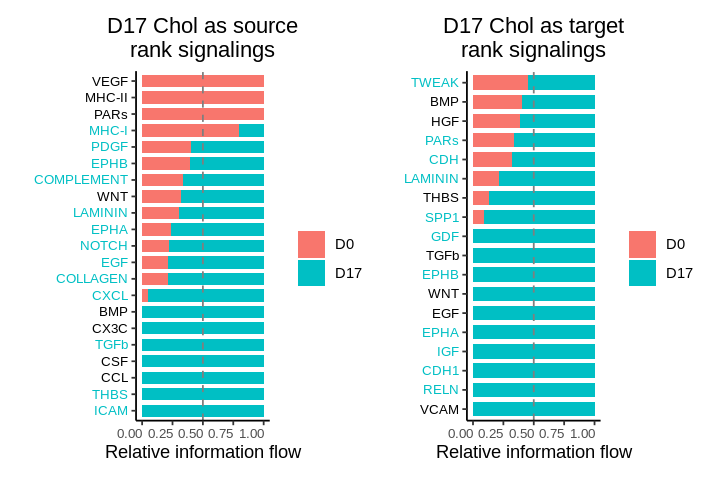

In [80]:
selected.target.pathways <- c("BMP", "HGF", "CDH", "PARs", "LAMININ", "THBS", "SPP1", "GDF", "TGFb", "EPHB", "WNT", "EGF", "EPHA", "RELN", "IGF", "CDH1", "VCAM", "TWEAK")
selected.source.pathways <- c("VEGF", "MHC-II", "PARs", "MHC-I", "PDGF", "EPHB", "COMPLEMENT", 
                              "LAMININ", "WNT", "EPHA", "NOTCH", "COLLAGEN", "EGF", "CXCL", "BMP", "CX3C", "TGFb", "CSF", "CCL", "THBS", "ICAM")

options(repr.plot.width = 6, repr.plot.height = 4)

g1 <- rankNet(cellchat.D0D17, mode = "comparison", stacked = T, do.stat = TRUE, 
              sources.use = "Cholangiocyte", title = "D17 Chol as source\nrank signalings", signaling = selected.source.pathways)
g2 <- rankNet(cellchat.D0D17, mode = "comparison", stacked = T, do.stat = TRUE, 
              targets.use = "Cholangiocyte", title = "D17 Chol as target\nrank signalings", signaling = selected.target.pathways)

g <- g1 + g2
print(g)

## 3g

In [666]:
# Load magic Ligand and Receptor genes data
magic <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220111_Magic_2nd/display_magic_LR.rds")

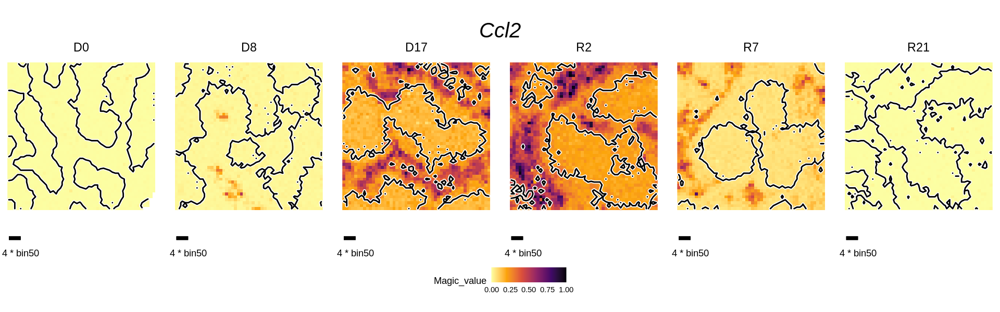

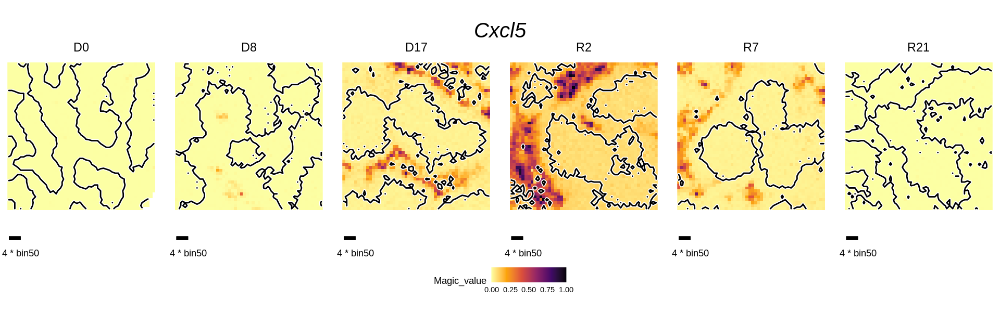

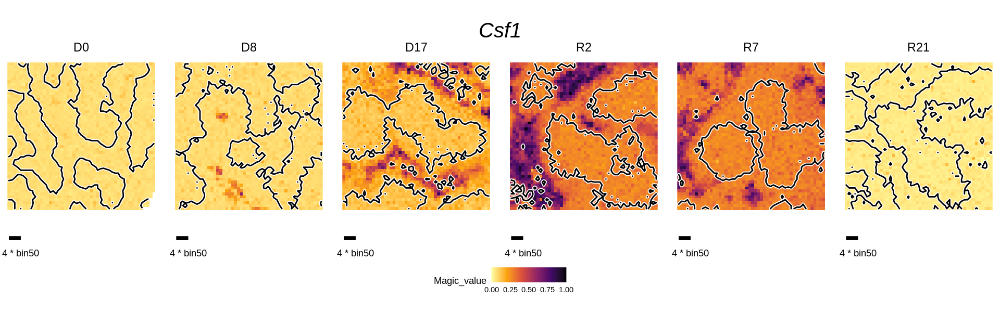

In [677]:
options(repr.plot.width = 16, repr.plot.height = 5)

for ( g in c("Ccl2", "Cxcl5", "Csf1")) {
    p <- MagicMeSub(g, lr_local, magic$result, lines = TRUE, facet = TRUE, rescale = TRUE) + 
    theme(strip.text = element_text(size = 14))
    print(p)
}

## 3h

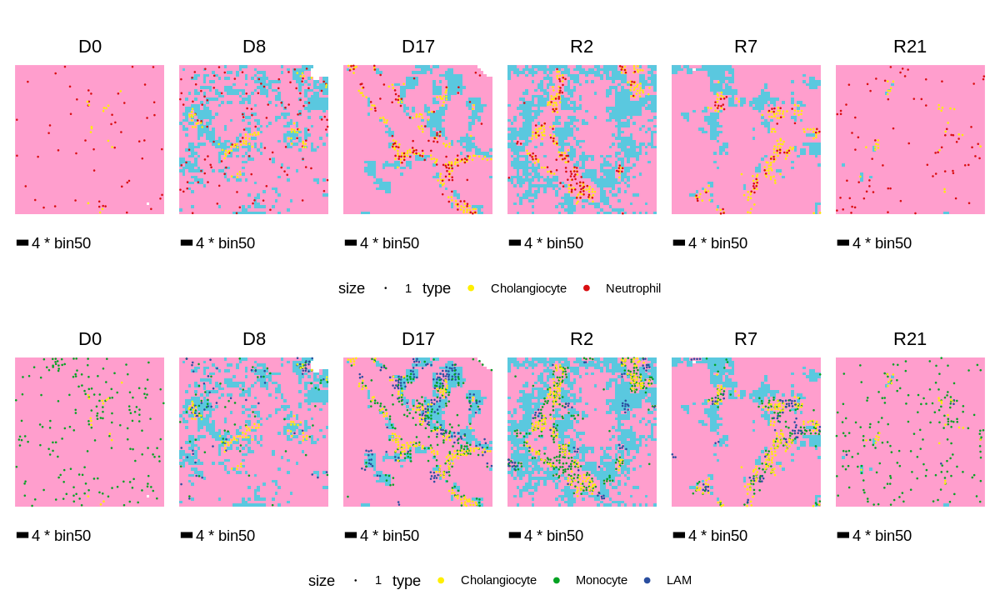

In [665]:
# Show the result
options(repr.plot.width = 10, repr.plot.height = 6)
options(warn = -1)
p1 <- ggpubr::ggarrange(plotlist = p2_List, legend = "bottom",
                  ncol = 6, nrow = 1, align = "v", common.legend = TRUE)
p2 <- ggpubr::ggarrange(plotlist = p1_List, legend = "bottom",
                  ncol = 6, nrow = 1, align = "v", common.legend = TRUE)
p1 / p2
options(warn = 0)

In [60]:
giveMeHeat <- function(dat, mask, pals, boom = c("HSC")) {

    masks_bk <- c("Hep", "Endo")
    if (missing(mask)) {
        mask = masks_bk
    } else {
        mask = c(mask, masks_bk)
    }

    extractWeight <- function(dat) {
        ## FUNCTION: accept a RCTD doublet mode result, return a weights Matrix
        ## obj
        results = dat@results
        tmp <- Matrix::Matrix(results$weights, sparse = T)

        return(tmp)
    }
    kmeanFilter <- function(weights, dims = 2, nn = 1) {
            ## FUNCTION: accept a weights Matrix obj, return a kmeans filter by
            ## cell types

            k.tmp <- apply(weights, 2, function(x) {
                ttt <- kmeans(x = x, centers = dims)

                res <- ttt$cluster; name <- names(res)

                toReserve <- head(order(ttt$centers, decreasing = TRUE), n = nn)
                res <- res %in% toReserve
                res <- as.integer(res); names(res) <- name

                return(res)
            })
            return(k.tmp %>%as.data.frame())
    }

    weights.df <- extractWeight(dat)
    kmeans.df <- kmeanFilter(weights.df)

    kmeans.df2 <- kmeanFilter(weights.df, dims = 4, nn = 2)
    kmeans.df[, boom] <- kmeans.df2[ rownames(kmeans.df), boom]

    npc_rank <- apply(kmeans.df, 2, sum) %>%
        sort(decreasing = T) %>%
        names()
    npc_rank <- npc_rank[!npc_rank %in% mask]

    for (i in npc_rank) {
        if (i == npc_rank[1]) {
            tmp.df <- cbind(dat@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], 
                            weights.df[kmeans.df[, i] == 1, i], 
                            i)
            tmp.df <- cbind(tmp.df, bin = rownames(tmp.df))
            rownames(tmp.df) <- NULL
        } else {
            tmp2.df <- cbind(dat@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], weights.df[kmeans.df[, i] == 1, i], i)
            tmp2.df <- cbind(tmp2.df, bin = rownames(tmp2.df))
            tmp.df <- rbind(tmp.df, tmp2.df)
        }
    }

    colnames(tmp.df) <- c("x", "y", "weights", "type", "bin")
    tmp.df$size <- 1
    tmp.df$size[which(tmp.df$type == "KC")] <- 0.1
    tmp.df$x <- tmp.df$x - min(tmp.df$x)
    tmp.df$y <- tmp.df$y - min(tmp.df$y)

    coords <- dat@spatialRNA@coords
    coords$x <- coords$x - min(coords$x)
    coords$y <- coords$y - min(coords$y)
    p <- ggplot(coords, aes(x = x, y = y)) + geom_raster(fill = "#ff9ecd") +
        coord_fixed()

    if ("LPLC_1" %in% npc_rank) {

        p <- p + geom_raster(data = coords[weights.df[kmeans.df$LPLC_1 ==
            1, "LPLC_1"][weights.df[kmeans.df$LPLC_1 == 1, "LPLC_1"] >= median(weights.df[kmeans.df$LPLC_1 ==
            1, "LPLC_1"])] %>%
            names(), ], show.legend = F, aes(x = x, y = y), fill = "#5ac8df")
    }
    
    LPLClist <- c()

    if ("LPLC" %in% npc_rank) {

        p <- p + geom_raster(data = coords[weights.df[kmeans.df$LPLC ==
            1, "LPLC"][weights.df[kmeans.df$LPLC == 1, "LPLC"] >= median(weights.df[kmeans.df$LPLC ==
            1, "LPLC"])] %>%
            names(), ], show.legend = F, aes(x = x, y = y), fill = "#5ac8df")
        
        LPLClist <- coords[weights.df[kmeans.df$LPLC ==
            1, "LPLC"][weights.df[kmeans.df$LPLC == 1, "LPLC"] >= median(weights.df[kmeans.df$LPLC ==
            1, "LPLC"])] %>%
            names(), ] %>% rownames()
    }

    
    draw.df <- tmp.df[ tmp.df$type %in% c(npc_rank),]
    draw.df <- draw.df[ !draw.df$type %in% c("LPLC_1", "LPLC"), ]
    
    p <- p + geom_point(data = draw.df, position = position_jitter(h = 0.3, w = 0.3),
        aes(x = x, y = y, color = type, size = size), show.legend = T) + scale_size_area(max_size = 0.005) +
        scale_color_manual(values = pals) +
    theme(legend.key = element_rect(fill = "white"))

    p <- p + 
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
    annotate("text", x = 10, y = -20, label = c("4 * bin50")) + theme_void()


    return(list(npc.df = tmp.df, plot = p, draw.df = draw.df, LPLC = LPLClist, coords = coords))
}

minDistancer <- function(obj, ref) {
    res <- obj
    res$dis <- apply(obj, 1, function(v) {
        tmp <- ref
        tmp$x <- tmp$x - v[1]
        tmp$y <- tmp$y - v[2]
        
        tmp <- (tmp$x)^2 + (tmp$y)^2
        tmp <- sqrt(tmp)
        return(min(tmp))
    }) %>% unlist()
    
    return(res)
}

RCTDextracter <- function(obj, extract) {
    res <- filter(obj$draw.df, type == extract)[,c("x", "y")]
    
    return(res)
}

giveMeDistance <- function(ident1, ident2, file) {
    refF <- RCTDextracter(file, ident1)
    objF <- RCTDextracter(file, ident2)
    
    result <- minDistancer(objF, refF)
    result$obj <- ident2; result$ref <- ident1
    
    return(result)
}

In [61]:
# Load RCTD output results, the spacexr::RCTD processing is explained detailedly in CIRSTA_Spatial_Transcriptomic_Analysis.ipynb
rctd_D0 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221024_LyEC_RCTD/rctd/20221024_rctd_LyEC_D0.rds")
rctd_D17 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221024_LyEC_RCTD/rctd/20221024_rctd_LyEC_D17.rds")

In [62]:
mask <- c("B cell", "cDC", "PC_LVEC", "PP_LVEC", "ILC1", "KC", "LSEC", "Monocyte", "Neutrophil", 
               "NK", "pDC", "T cell", "LAM", "HSC", "Fibroblast", "Mesothelial cell", "LyEC", "VSMC", "Hep_div", "Stromal cell")
mask <- mask[! mask %in% c("LyEC", "LAM", "Neutrophil", "Monocyte", "HSC", "KC")]
                       
pal <- c(Cholangiocyte = "#ffef00", LyEC = "#00a120",  Monocyte = "#c8509b", LAM = "#2c2c2c", HSC = "#073290", KC = "#ff8000",
          Monocyte = "#c8509b", LAM = "#cdd788", 
          Neutrophil = "#d90e11")

fil_D0 <- giveMeHeat(rctd_D0, mask = c(mask, "LAM"), pals = pal)
fil_D17 <- giveMeHeat(rctd_D17, mask = mask, pals = pal)

Neu_D17 <- giveMeDistance(ident1 = "Cholangiocyte", ident2 = "Neutrophil", file = fil_D17)
Mono_D17 <- giveMeDistance(ident1 = "Cholangiocyte", ident2 = "Monocyte", file = fil_D17)

Neu_D0 <- giveMeDistance(ident1 = "Cholangiocyte", ident2 = "Neutrophil", file = fil_D0)
Mono_D0 <- giveMeDistance(ident1 = "Cholangiocyte", ident2 = "Monocyte", file = fil_D0)

In [65]:
Neu_D0$time <- "D0"
Mono_D0$time <- "D0"

Neu_D17$time <- "D17"
Mono_D17$time <- "D17"

Neu <- rbind(Neu_D0, Neu_D17)
Mono <- rbind(Mono_D0, Mono_D17)

Neu$time <- factor(Neu$time)
Mono$time <- factor(Mono$time)

df <- rbind(Neu, Mono)

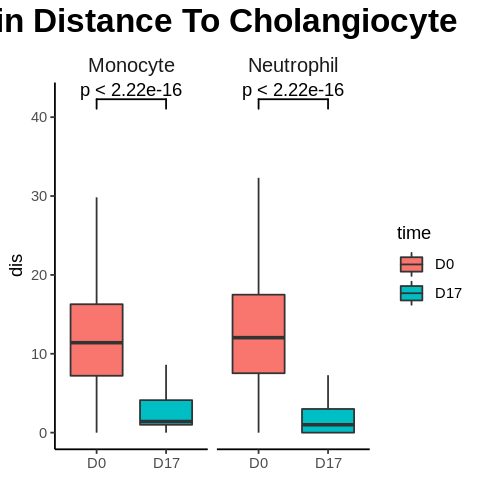

In [68]:
options(repr.plot.width = 4, repr.plot.height = 4)

p1 <- df %>% ggplot(aes(x = time, y = dis)) + geom_boxplot(aes(fill = time), outlier.shape = NA) +
labs(title = stringr::str_to_title("min distance to cholangiocyte"), x = NULL) +
ggsignif::geom_signif(comparisons = list(c("D0", "D17")), map_signif_level = F) + 
theme_classic() +
facet_wrap(~obj) + 
theme(strip.text = element_text(size = 12),
    plot.title = element_text(face = "bold", hjust = .5, size = 20), 
    strip.background = element_blank()
    )

p1

# Fig.4

## 4e

In [51]:
giveMeHeat <- function(dat, mask, pals) {

    masks_bk <- c("Hep", "Endo")
    if (missing(mask)) {
        mask = masks_bk
    } else {
        mask = c(mask, masks_bk)
    }

    extractWeight <- function(dat) {
        ## FUNCTION: accept a RCTD doublet mode result, return a weights Matrix
        ## obj
        results = dat@results
        tmp <- Matrix::Matrix(results$weights, sparse = T)

        return(tmp)
    }
    kmeanFilter <- function(weights, dims = 2) {
        ## FUNCTION: accept a weights Matrix obj, return a kmeans filter by
        ## cell types

        k.tmp <- apply(weights, 2, function(x) {
            ttt <- kmeans(x = x, centers = dims)
            res <- rep(0, length(ttt$cluster))
            names(res) <- names(ttt$cluster)
            res[names(ttt$cluster)[ttt$cluster == which(ttt$centers == max(ttt$centers))]] <- 1
            return(res)
        })
        return(k.tmp %>%
            as.data.frame())
    }

    weights.df <- extractWeight(dat)
    kmeans.df <- kmeanFilter(weights.df)

    npc_rank <- apply(kmeans.df, 2, sum) %>%
        sort(decreasing = T) %>%
        names()
    npc_rank <- npc_rank[!npc_rank %in% mask]

    for (i in npc_rank) {
        if (i == npc_rank[1]) {
            tmp.df <- cbind(dat@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], weights.df[kmeans.df[, i] == 1, i], i)
            tmp.df <- cbind(tmp.df, bin = rownames(tmp.df))
            rownames(tmp.df) <- NULL
        } else {
            tmp2.df <- cbind(dat@spatialRNA@coords[rownames(kmeans.df)[kmeans.df[,
                i] == 1], ], weights.df[kmeans.df[, i] == 1, i], i)
            tmp2.df <- cbind(tmp2.df, bin = rownames(tmp2.df))
            tmp.df <- rbind(tmp.df, tmp2.df)
        }
    }

    colnames(tmp.df) <- c("x", "y", "weights", "type", "bin")
    tmp.df$size <- 1
    tmp.df$size[which(tmp.df$type == "KC")] <- 0.1
    tmp.df$x <- tmp.df$x - min(tmp.df$x)
    tmp.df$y <- tmp.df$y - min(tmp.df$y)


    coords <- dat@spatialRNA@coords
    coords$x <- coords$x - min(coords$x)
    coords$y <- coords$y - min(coords$y)
    p <- ggplot(coords, aes(x = x, y = y)) + geom_tile(fill = "#ff9ecd") + coord_fixed()


    if ("LPLC_1" %in% npc_rank) {

        p <- p + geom_tile(data = coords[weights.df[kmeans.df$LPLC_1 == 1, "LPLC_1"][weights.df[kmeans.df$LPLC_1 ==
            1, "LPLC_1"] >= median(weights.df[kmeans.df$LPLC_1 == 1, "LPLC_1"])] %>%
            names(), ], show.legend = F, aes(x = x, y = y), fill = "#5ac8df")
    }

    LPLClist <- c()

    if ("LPLC" %in% npc_rank) {

        p <- p + geom_tile(data = coords[weights.df[kmeans.df$LPLC == 1, "LPLC"][weights.df[kmeans.df$LPLC ==
            1, "LPLC"] >= median(weights.df[kmeans.df$LPLC == 1, "LPLC"])] %>%
            names(), ], show.legend = F, aes(x = x, y = y), fill = "#5ac8df")

        LPLClist <- coords[weights.df[kmeans.df$LPLC == 1, "LPLC"][weights.df[kmeans.df$LPLC ==
            1, "LPLC"] >= median(weights.df[kmeans.df$LPLC == 1, "LPLC"])] %>%
            names(), ] %>%
            rownames()
    }

    draw.df <- tmp.df[tmp.df$type %in% c(npc_rank), ]
    draw.df <- draw.df[!draw.df$type %in% c("LPLC_1", "LPLC"), ]

    p <- p + geom_point(data = draw.df, position = position_jitter(h = 0.3, w = 0.3),
        aes(x = x, y = y, color = type, size = size), show.legend = T) + scale_size_area(max_size = 0.005) +
        scale_color_manual(values = pal) + theme(legend.key = element_rect(fill = "white"))

    p <- p + annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2,
        colour = "black") + annotate("text", x = 10, y = -20, label = c("4 * bin50")) +
        theme_void()


    return(list(npc.df = tmp.df, plot = p, draw.df = draw.df, LPLC = LPLClist))
}

In [54]:
# Load the data
rctd_D17 <- list(D17_chol = readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220802_rctd_visualize/rctd/20220803_rctd_anno_fig2_D17.rds"), D17_LPLCsub = readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220526_RCTD/rctd/20220527_rctd_D17.rds"))

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

D17_local <- paneMaker(data = temp_data, cx = 46, cy = 179, r = 60, t = "D17")

In [57]:
mask <- c("B cell", "cDC", "CV_LEC", "ILC1", "KC", "LSEC", "Mono", "Neu", "NK", "pDC", "PV_LEC", "T cell", "MoMF", "HSC", "FB", "Mesothelial", "VSMC", "Hep_div", "Stromal cell")

pal <- c(Chol = "#ffef00", 
         KC = "#00a120",  MoMF = "#c8509b",  Mono = "#8d278a", `T cell` = "#2c2c2c", 
         `B cell` = "#073290", Neu = "#d90e11")
D17_result <- giveMeHeat(rctd_D17[[1]], mask = mask, pals = pal)

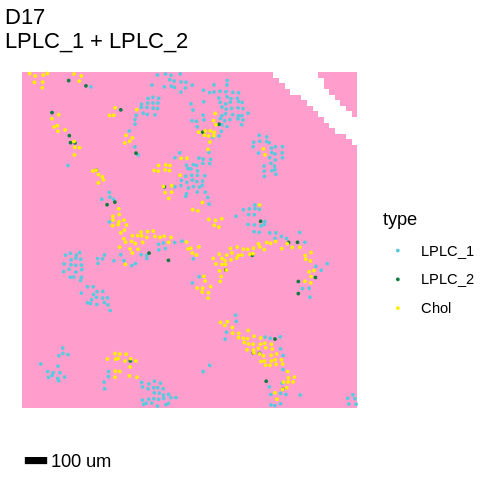

In [61]:
weights <- rctd_D17[[2]]@results$weights[, c("LPLC_1", "LPLC_2")]
coords <- rctd_D17[[2]]@spatialRNA@coords; coords$type <- "pass"

for (c in c("LPLC_1", "LPLC_2")) {
    tmp <- kmeans(weights[, c], centers = 4)
    reserved <- tmp$cluster[tmp$cluster %in% head(order(tmp$centers, decreasing = T) ,n = 1)] %>% names
    reserved_tmp <- coords[ reserved,]; reserved_tmp$type <- c; reserved_tmp$bin <- reserved
    
    if (c == "LPLC_1") {
        result <- reserved_tmp
    } else {
        result <- rbind(result, reserved_tmp)
    }
}

result <- rbind(result, D17_result$draw.df[, c("x", "y", "type", "bin")])
result[, c("x", "y")] <- coords[ result$bin, c("x", "y")]

result_D17_global <- result

# D7_local bins
coords <- coords[ rownames(D17_local), ]
result <- result[ result$bin %in% rownames(coords),]

{
    coords$x <- coords$x - min(coords$x)
    coords$y <- coords$y - min(coords$y)
    
    result[, c("x", "y")] <- coords[ result$bin, c("x", "y")]
}

pals.used <- c(LPLC_1 = "#5ac8df", LPLC_2 = "#107b40", Chol = "#ffef00")

p <- ggplot(coords, aes(x, y)) + geom_tile(fill = "#ff9ecd") + coord_fixed()

options(repr.plot.width = 4, repr.plot.height = 4)
g1 <- p + geom_point(data = result, aes(x, y, color = type), position = position_jitter(h = 0.3, w = 0.3), size = .4) + 
scale_color_manual(values = pals.used) + labs(title = "D17\nLPLC_1 + LPLC_2") +
annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2,
        colour = "black") + annotate("text", x = 10, y = -10, label = c("4 * bin50")) +
        theme_void()
print(g1)

In [65]:
result <- result_D17_global

ref.Chol <- filter(result, type == "Chol")

for (t in c("LPLC_1", "LPLC_2")) {
    tmp <- filter(result, type == t)
    
    tmp$min_chol_distance <- NA

    for (cell in rownames(tmp)) {
        ref.Chol[, c("cell_x", "cell_y")] <- tmp[cell, c("x", "y")]
        
        # 添加最小距离的平方
        tmp[cell, "min_chol_distance"] <- apply(ref.Chol[, c("x", "y", "cell_x",
            "cell_y")], 1, function(v) {
            value <- (v["x"] - v["cell_x"])^2 + (v["y"] - v["cell_y"])^2
            return(value)
        }) %>%
            min
    }
    
    if ( t == "LPLC_1" ) {
        chol_distance <- tmp
    } else {
        chol_distance <- rbind(chol_distance, tmp)
    }
}

chol_distance$min_chol_distance <- sqrt(chol_distance$min_chol_distance)


# LPLC_rctd <- chol_distance

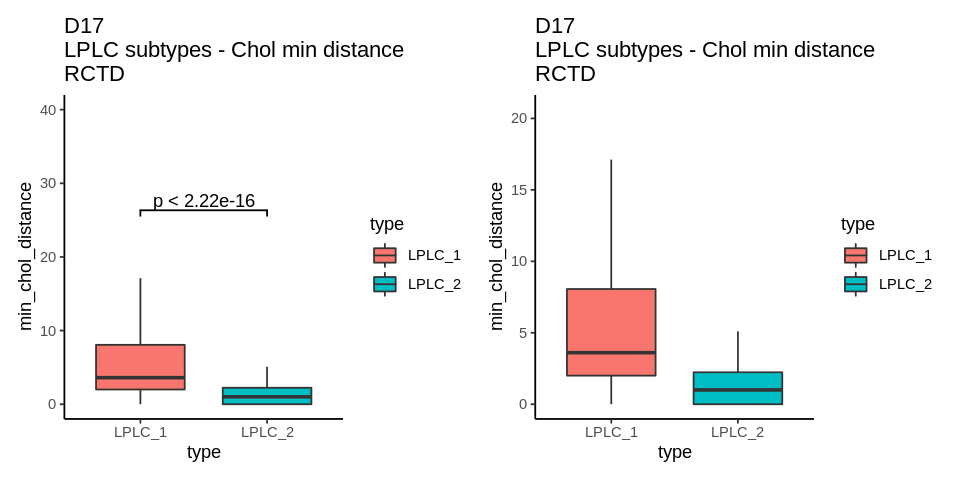

In [67]:
p1 <- ggplot(chol_distance, aes(x = type, y = min_chol_distance, fill = type)) + 
geom_boxplot(outlier.shape = NA, width=0.7) + 
ggsignif::geom_signif(comparisons = list(c("LPLC_1", "LPLC_2")), map_signif_level = F) + 
coord_cartesian(ylim = c(0, 40)) + theme_classic() +
labs(title = "D17\nLPLC subtypes - Chol min distance\nRCTD")

p2 <- ggplot(chol_distance, aes(x = type, y = min_chol_distance, fill = type)) + 
geom_boxplot(outlier.shape = NA, width=0.7) + 
ggsignif::geom_signif(comparisons = list(c("LPLC_1", "LPLC_2")), map_signif_level = F) + 
coord_cartesian(ylim = quantile(chol_distance$min_chol_distance, c(0.0, 0.99))) + theme_classic() +
labs(title = "D17\nLPLC subtypes - Chol min distance\nRCTD")

g <- p1 + p2

options(repr.plot.width = 8, repr.plot.height = 4)
print(g)

## 4f

In [68]:
spatialDomain_meta <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20230323_first_revision_DDC/dataReady/20230517_Niche_22_slides_meta_annotation_advanced_ed2.rds")

head(spatialDomain_meta, 3)


,orig.ident,nCount_RNA,nFeature_RNA,time,slide,lib,percent.mt,Cholniche,B_cell,LAM,⋯,DNA_damage,Inflammation,Fibrosis,annotation,annotation_macro,x,y,rank,rank_distance,display
,<fct>,<dbl>,<int>,<fct>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>
BIN.93_5,niche22slides,5913,1682,D0,DY1,Niche,1.234568,Other area,-0.008305227,-0.2341839,⋯,-0.1050565,-0.14789724,-0.2035674,Hepa-domain,Hepa-domain,92,261,4,-0.3070456,1
BIN.94_5,niche22slides,6659,1772,D0,DY1,Niche,1.486710,Other area,-0.016493705,-0.3364611,⋯,-0.1083980,-0.15128474,-0.2057190,Hepa-domain,Hepa-domain,93,261,4,-0.3742820,1
BIN.95_5,niche22slides,7495,1895,D0,DY1,Niche,1.494330,Other area,-0.013415794,-0.3539215,⋯,-0.1244256,-0.05924523,-0.1995001,Hepa-domain,Hepa-domain,94,261,3,-0.5472397,1


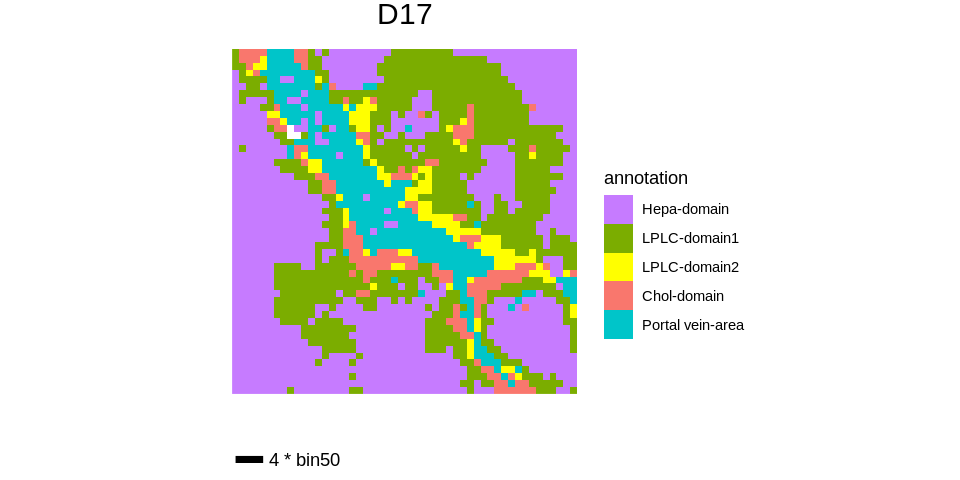

In [98]:
lplc.palette <- c("#c67bff", "#7bad00", "#ffff00", "#f9776d", "#00c5c9")
names(lplc.palette) <- c("Hepa-domain", "LPLC-domain1", "LPLC-domain2", "Chol-domain", "Portal vein-area")

p <- ggplot(dplyr::filter(domain_local, time == "D17"), aes(py, px)) +
    geom_raster(aes(fill = annotation)) +
    scale_fill_manual(values = lplc.palette) +
    coord_fixed() + theme_void() +
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2,colour = "black") + 
    annotate("text", x = 10, y = -10, label = c("4 * bin50")) + 
    facet_wrap(~time, nrow = 1, ncol = 6) +
    theme(legend.position = "right", strip.text = element_text(size = 18))

p

### BoxPlot

In [118]:
meta <- dplyr::filter(spatialDomain_meta, time == "D17" & lib == "Niche" & annotation %in% c("Chol-domain", "LPLC-domain1", "LPLC-domain2"))
ref.Chol_meta <- filter(meta, annotation == "Chol-domain")

for ( t in c("LPLC-domain1", "LPLC-domain2")) {
    tmp <- filter(meta, annotation == t)
    tmp$min_chol_distance <- NA
    
    for (cell in rownames(tmp)) {
        ref.Chol_meta[, c("cell_x", "cell_y")] <- tmp[cell, c("x", "y")]
        
        # 添加最小距离的平方
        tmp[cell, "min_chol_distance"] <- apply(ref.Chol_meta[, c("x", "y", "cell_x",
            "cell_y")], 1, function(v) {
            value <- (v["x"] - v["cell_x"])^2 + (v["y"] - v["cell_y"])^2
            return(value)
        }) %>%
            min()
    }
    
    if ( t == "LPLC-domain1" ) {
        chol_distance_meta <- tmp
    } else {
        chol_distance_meta <- rbind(chol_distance_meta, tmp)
    }
}

chol_distance_meta$min_chol_distance <- sqrt(chol_distance_meta$min_chol_distance)

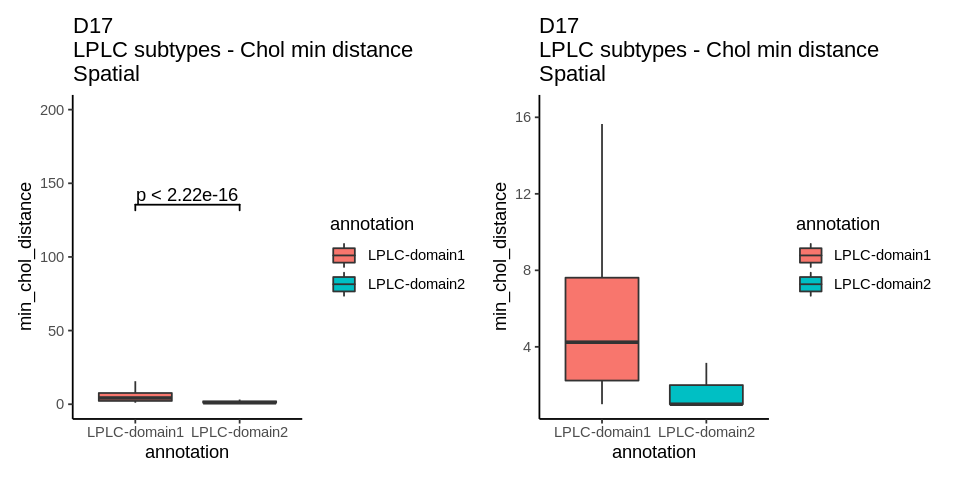

In [120]:
p1 <- ggplot(chol_distance_meta, aes(x = annotation, y = min_chol_distance, fill = annotation)) + 
geom_boxplot(outlier.shape = NA, width=0.7) + 
ggsignif::geom_signif(comparisons = list(c("LPLC-domain1", "LPLC-domain2")), map_signif_level = F) + 
coord_cartesian(ylim = c(0, 200)) + theme_classic() +
labs(title = "D17\nLPLC subtypes - Chol min distance\nSpatial")

p2 <- ggplot(chol_distance_meta, aes(x = annotation, y = min_chol_distance, fill = annotation)) + 
geom_boxplot(outlier.shape = NA, width=0.7) + 
coord_cartesian(ylim = quantile(chol_distance_meta$min_chol_distance, c(0.0, 0.95))) + theme_classic() +
ggsignif::geom_signif(comparisons = list(c("LPLC-domain1", "LPLC-domain2")), map_signif_level = T) + 
labs(title = "D17\nLPLC subtypes - Chol min distance\nSpatial")

g2 <- p1 + p2

options(repr.plot.width = 8, repr.plot.height = 4)
print(g2)

## 4i

In [4]:
magic_spatialDomain <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20221115_niche_magic/20221115_niche_magic_LR.rds")

domain_D17_local <- paneMaker(data = spatialDomain_meta, cx = 75, cy = 174, r = 50, t = "D17")
domain_D17_local[, c("x", "y")] <- domain_D17_local[, c("y", "x")]

In [42]:
NicheMeMagic <- function(gene, niche, magic, highlight, thresh = 0) {
    tmp_df <- niche
    
    tmp_df$x <- tmp_df$x - min(tmp_df$x)
    tmp_df$y <- tmp_df$y - min(tmp_df$y)
    
    tmp_df$value <- magic[ rownames(tmp_df), gene]
    
    lplc.palette <- c("#eed7ff", "#7bad00", "#ffff00", "#f9776d", "#b3eeef")
    names(lplc.palette) <- c("Hepa-domain", "LPLC-domain1", "LPLC-domain2", "Chol-domain", "Portal vein-area")

    halfgreen <- "#bed782"; halfyellow <- "#ffffbf"    

    if ("LPLC-domain1" %in% highlight) {
        lplc.palette[ !names(lplc.palette) %in% highlight ] <- "grey"
        lplc.palette["LPLC-domain2"] <- halfyellow
    } else if("LPLC-domain2" %in% highlight){
        lplc.palette[ !names(lplc.palette) %in% highlight ] <- "grey"
        lplc.palette["LPLC-domain1"] <- halfgreen
    } else if ("LPLC" %in% highlight) {
        lplc.palette[ !names(lplc.palette) %in% highlight ] <- "grey"
        lplc.palette[c("LPLC-domain1", "LPLC-domain2")] <- "#7bad00"
    }
    
    p <- ggplot(tmp_df, aes(x, y, fill = annotation)) + 
        geom_raster() +# scale_alpha_manual(values = alpha.palette) + 
        coord_equal() + theme_void() + 
        scale_fill_manual(values = lplc.palette) + ggtitle(label = gene) + 
        geom_point(data = tmp_df[tmp_df$value > quantile(tmp_df$value, probs = thresh), ], 
                   aes(x, y, alpha = value, size = 1), fill = "#aa632a", color = "black") + 
        scale_size_area(max_size = 2.5) +
        theme(plot.title = element_text(hjust = .5, size = 20)) + 
        annotate("segment", x = 0, xend = 4, y = -5, yend = -5, size = 2, colour = "black") + 
        annotate("text", x = 10, y = -6, label = c("4 * bin50")) + 
        theme(plot.title = element_text(face = "italic"))
    
    return(p)
}

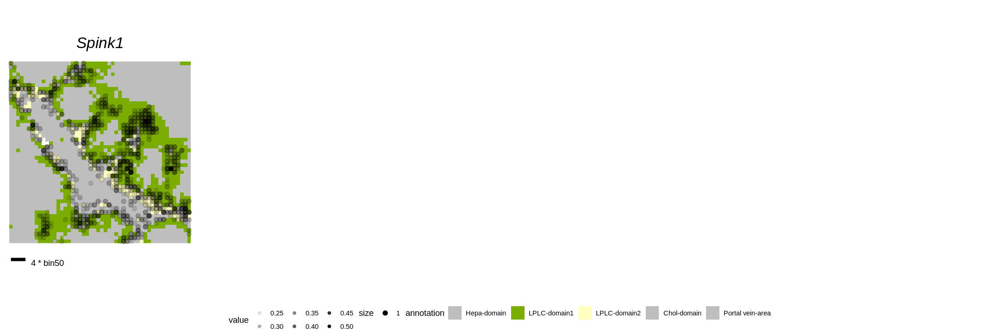

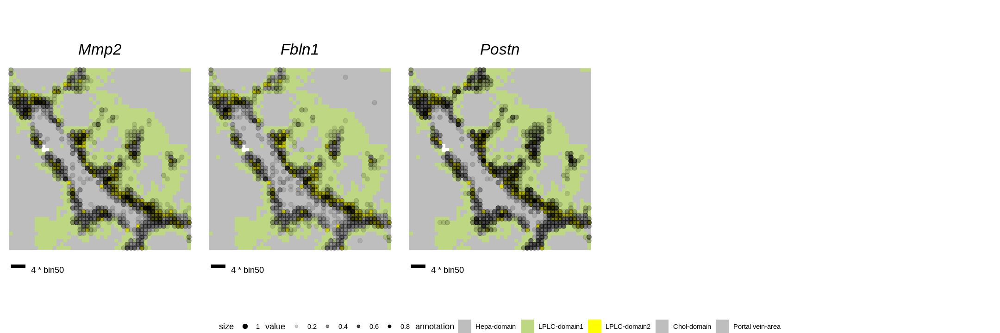

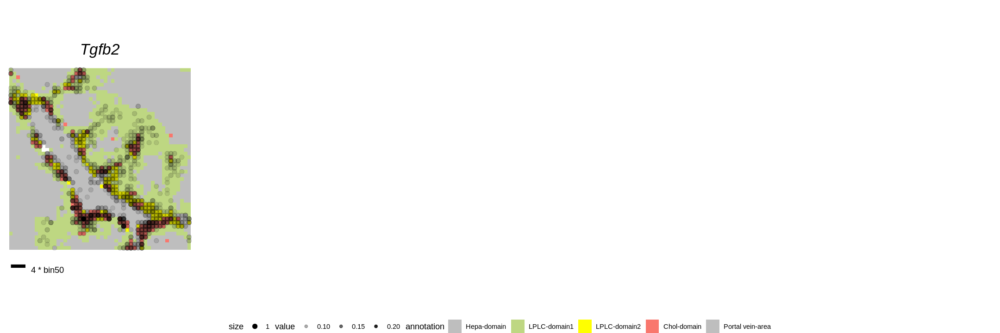

In [43]:
plist <- list()
for ( g in c("Spink1")) {
    p <- NicheMeMagic(gene = g, niche = domain_D17_local, magic = magic_spatialDomain$result, highlight = c("LPLC-domain1"), thresh = .75)
    plist[[g]] <- p
}

for ( g in c("Mmp2", "Fbln1", "Postn")) {
    p <- NicheMeMagic(gene = g, niche = domain_D17_local, magic = magic_spatialDomain$result, highlight = c("LPLC-domain2"), thresh = .75)
    plist[[g]] <- p
}

for ( g in c("Tgfb2")) {
    p <- NicheMeMagic(gene = g, niche = domain_D17_local, magic = magic_spatialDomain$result, highlight = c("LPLC-domain2", "Chol-domain"), thresh = .75)
    plist[[g]] <- p
}
options(repr.plot.width = 18, repr.plot.height = 6)

ggpubr::ggarrange(plotlist = plist[c("Spink1")], legend = "bottom",
                  ncol = 5, nrow = 1, align = "v", common.legend = T)
ggpubr::ggarrange(plotlist = plist[c("Mmp2", "Fbln1", "Postn")], legend = "bottom",
                  ncol = 5, nrow = 1, align = "v", common.legend = T)
ggpubr::ggarrange(plotlist = plist[c("Tgfb2")], legend = "bottom",
                  ncol = 5, nrow = 1, align = "v", common.legend = T)

# Fig.5

## 5a

[1] "Input is a SeuratObj"


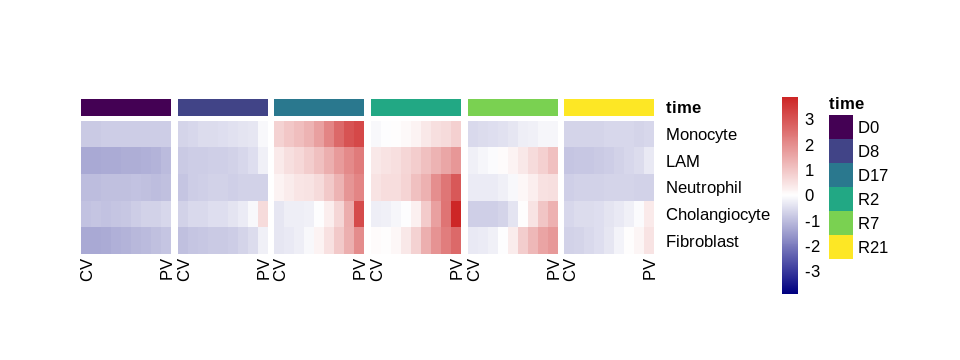

In [574]:
options(repr.plot.width = 8, repr.plot.height = 3)
zonation_statheatmap(data = zonation_statistician(data = sp, features = c("Monocyte", "LAM", "Neutrophil", "Cholangiocyte", "Fibroblast")), 
                     title = "")

## 5b

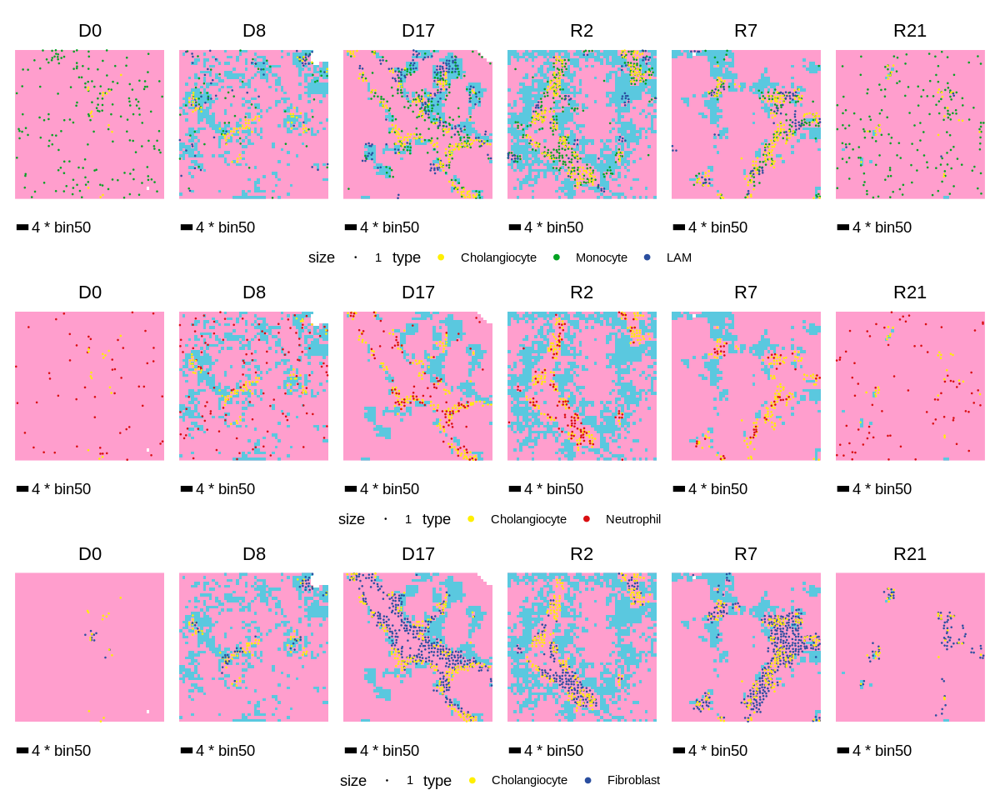

In [639]:
# Show the result
options(repr.plot.width = 10, repr.plot.height = 8)
options(warn = -1)
p1 <- ggpubr::ggarrange(plotlist = p1_List, legend = "bottom",
                  ncol = 6, nrow = 1, align = "v", common.legend = TRUE)
p2 <- ggpubr::ggarrange(plotlist = p2_List, legend = "bottom",
                  ncol = 6, nrow = 1, align = "v", common.legend = TRUE)
p3 <- ggpubr::ggarrange(plotlist = p3_List, legend = "bottom",
                  ncol = 6, nrow = 1, align = "v", common.legend = TRUE)

p1 / p2 / p3
options(warn = 0)

## 5c

[1] "Input is a SeuratObj"


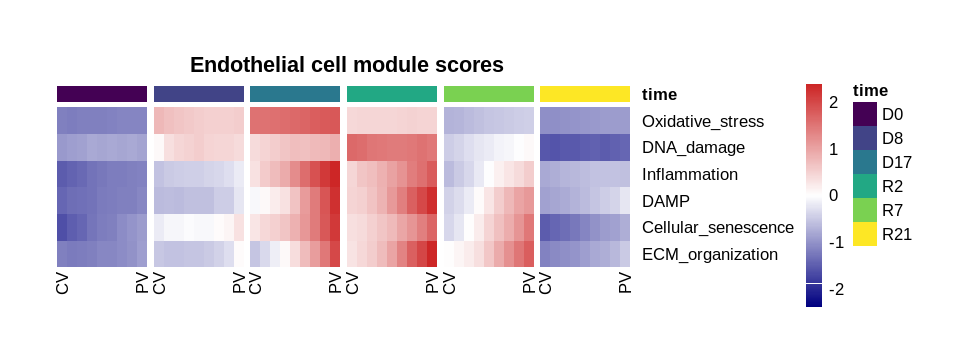

In [579]:
options(repr.plot.width = 8, repr.plot.height = 3)
zonation_statheatmap(data = zonation_statistician(data = sp, features = c("Oxidative_stress", "DNA_damage", "Inflammation", "DAMP", "Cellular_senescence", "ECM_organization")), 
                     title = "Endothelial cell module scores")

## 5d

In [580]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(134, 56), `D8` = c(126, 73), `D17` = c(51, 144),
    `R2`= c(153, 181), `R7` = c(182, 163), `R21` = c(87, 180)
)

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(temp_data, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        spatial_local <- tmp
    } else {
        spatial_local <- rbind(spatial_local, tmp)
    }
}

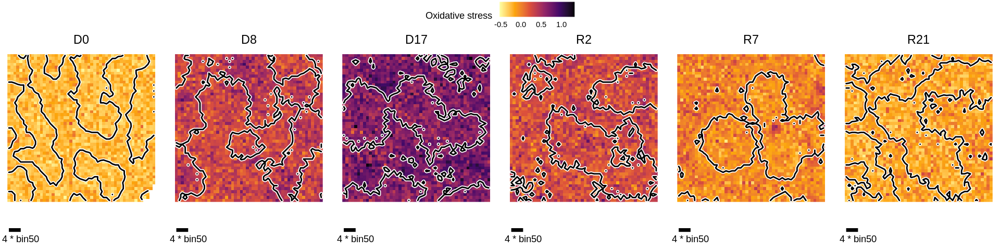

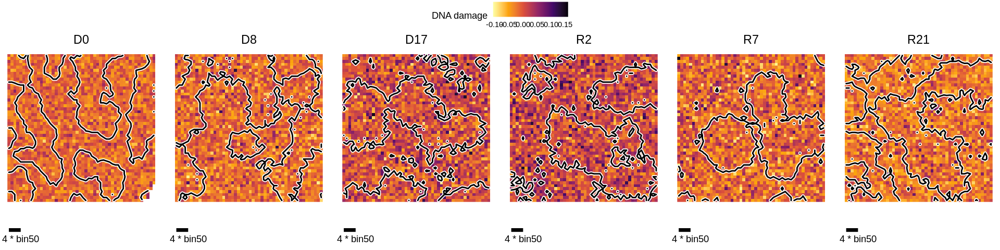

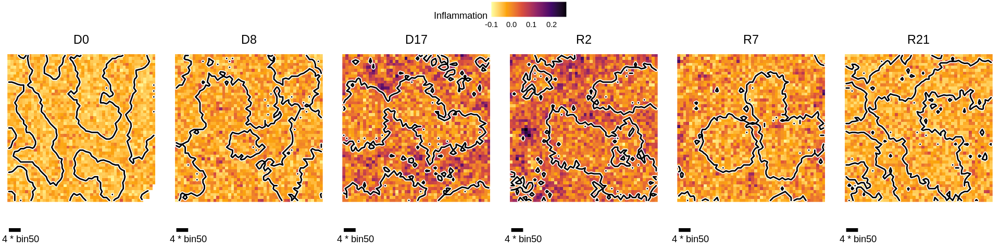

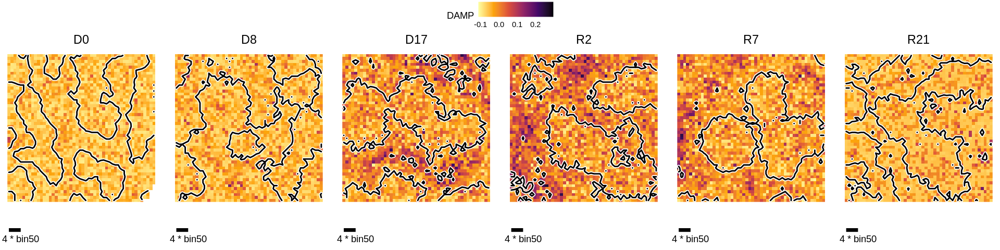

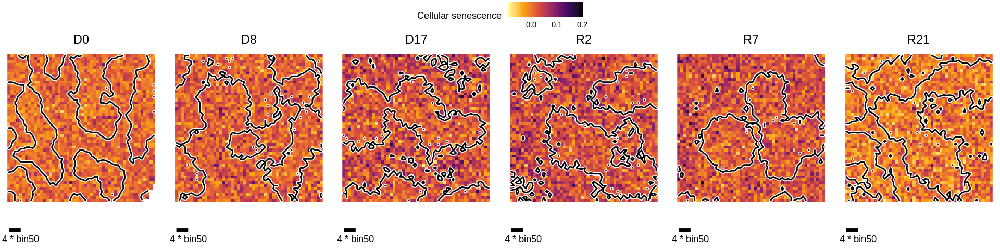

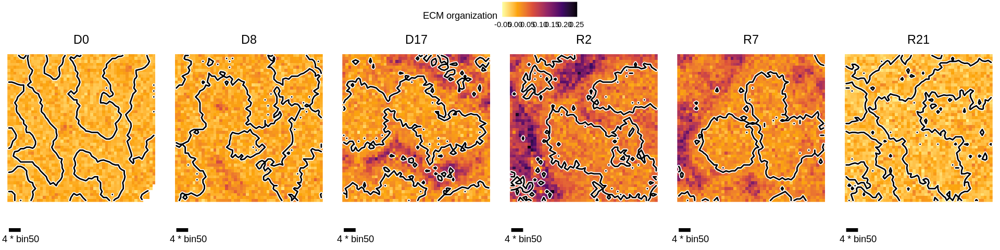

In [585]:
pList <- list()
for (path in c("Oxidative_stress", "DNA_damage", "Inflammation", "DAMP", "Cellular_senescence", "ECM_organization")) {
    p <- ggplot(spatial_local, aes(px, py)) +
    geom_raster(aes_string(fill = path)) +
    scale_fill_viridis_c(option = "B", direction = -1) +
    geom_contour(aes(z = rank), breaks = 5, color = "white", size = 1.8, lineend = "round", linejoin = "round") + 
    geom_contour(aes(z = rank), breaks = 5, color = "black", size = .8, lineend = "round", linejoin = "round") + 
    labs(fill = gsub("_", " ", path)) +
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
    annotate("text", x = 4, y = -13, label = c("4 * bin50")) +
    coord_fixed() + theme_void() +
    facet_wrap(~time, ncol = 6) +
    theme(legend.position = "top", legend.direction = "horizontal", plot.title = element_text(size = 16), strip.text = element_text(size = 14)) +
    guides(fill = guide_colorbar(ticks.colour = NA))
    
    plot(p)
    pList[[path]] <- p
}

# Fig.6

## 6a

In [10]:
t <- LineGen(obj = sp, features = c("Atoh8", "Mki67"), slot = "data")

line_pal <- c("#e64a35", "#4dbad4", "#009f86", "#3b5387", "#f39b7e", "#8491b4")
names(line_pal) <- c("D0", "D8", "D17", "R2", "R7", "R21")

p_list <- list()
for ( f in c("Atoh8", "Mki67") ) {
    p <- ggplot(dplyr::filter(t, variable == f), aes(layer, value)) +
    geom_line(aes(group = time, color = time), size = 1) + 
    labs(x = NULL, y = f, title = NULL) +
    scale_color_manual(values = line_pal) +
    theme_bw(base_rect_size = 1) +
    theme(axis.text.x = element_text(angle = 45, size = 12), axis.title.y = element_text(hjust = 0.5, face = "italic", size = 24), legend.position = "bottom",
      panel.grid = element_blank(), 
      plot.title = element_text(hjust = 0.5, face = "italic"))
    
    p_list[[f]] <- p
}

Using time, id as id variables



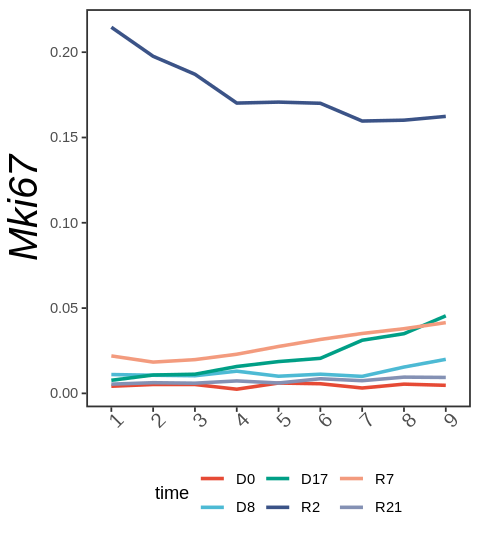

In [11]:
options(repr.plot.width = 4, repr.plot.height = 4.5)
p_list[["Mki67"]]

In [123]:
# Storing the pane center on representative slides
paneCenter_List <- list(
    `D0` = c(134, 56), `D8` = c(126, 73), `D17` = c(51, 144),
    `R2`= c(153, 181), `R7` = c(182, 163), `R21` = c(87, 180)
)

temp_data <- sp@meta.data
temp_data$display <- 0; temp_data$display[ temp_data$slide %in% representative_slides] <- 1;

for (i in names(paneCenter_List)) {
    tmp <- paneMaker(temp_data, paneCenter_List[[i]][1], paneCenter_List[[i]][2], 50, i)
    tmp$px <- tmp$x - min(tmp$x)
    tmp$py <- tmp$y - min(tmp$y)
    
    if ( i == "D0" ) {
        cc_local <- tmp
    } else {
        cc_local <- rbind(cc_local, tmp)
    }
}

cc_local$display <- 1
cc_local[, c("x", "y")] <- cc_local[, c("px", "py")]

In [129]:
cellcycle_module <- readRDS("/sibcb1/huilijianlab1/wubohua/R/BGI_20211223/Spatial_20220315/meta_module score G2M S 20220430.rds")

cellcycle_module <- cellcycle_module[ rownames(cc_local), c("G2M1", "S1")]
colnames(cellcycle_module) <- c("GSM", "S")
cc_local <- cbind(cc_local, cellcycle_module[ rownames(cc_local),])

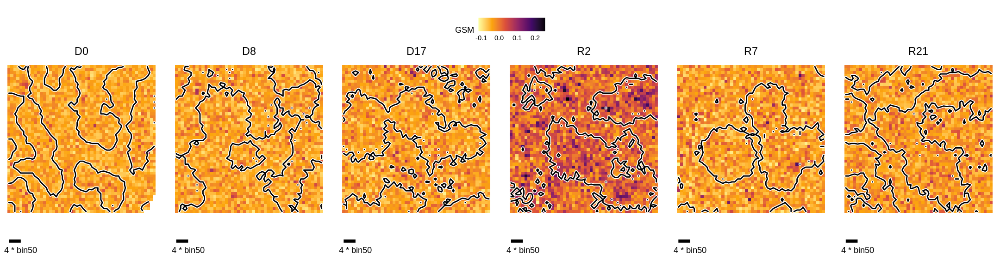

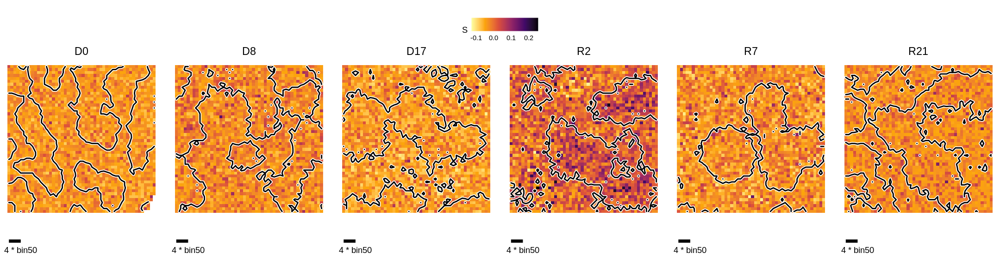

In [134]:
options(repr.plot.width = 18, repr.plot.height = 5)

for (path in c("GSM", "S")) {
    p <- ggplot(cc_local, aes(px, py)) +
    geom_raster(aes_string(fill = path)) +
    scale_fill_viridis_c(option = "B", direction = -1) +
    geom_contour(aes(z = rank), breaks = 5, color = "white", size = 1.8, lineend = "round", linejoin = "round") + 
    geom_contour(aes(z = rank), breaks = 5, color = "black", size = .8, lineend = "round", linejoin = "round") + 
    labs(fill = gsub("_", " ", path)) +
    annotate("segment", x = 0, xend = 4, y = -10, yend = -10, size = 2, colour = "black") + 
    annotate("text", x = 4, y = -13, label = c("4 * bin50")) +
    coord_fixed() + theme_void() +
    facet_wrap(~time, ncol = 6) +
    theme(legend.position = "top", legend.direction = "horizontal", plot.title = element_text(size = 16), strip.text = element_text(size = 14)) +
    guides(fill = guide_colorbar(ticks.colour = NA))
    
    plot(p)
}

## 6b

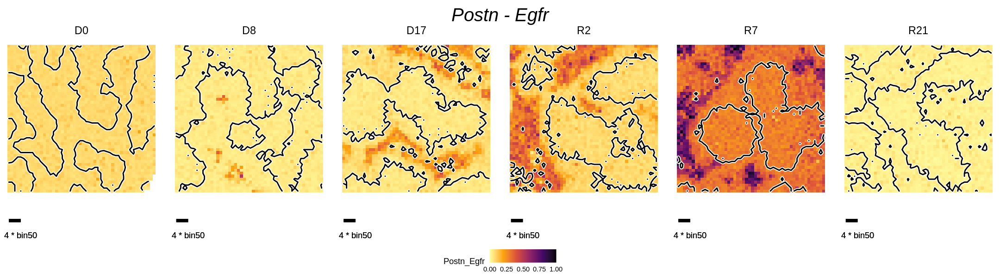

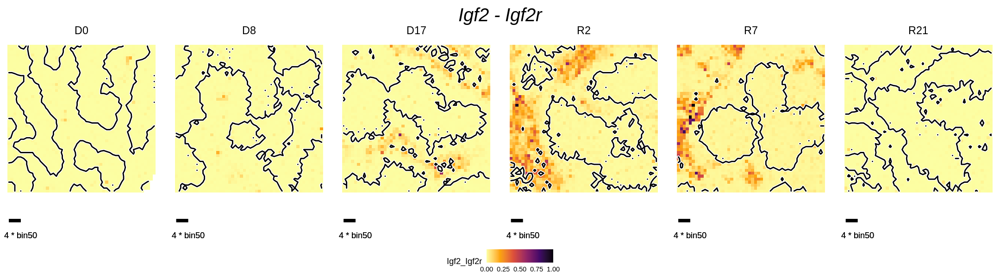

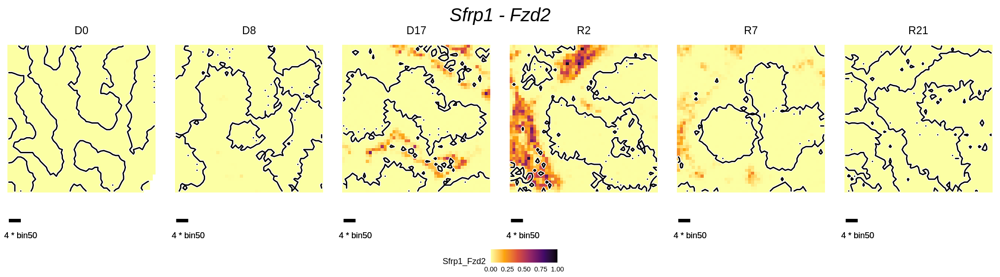

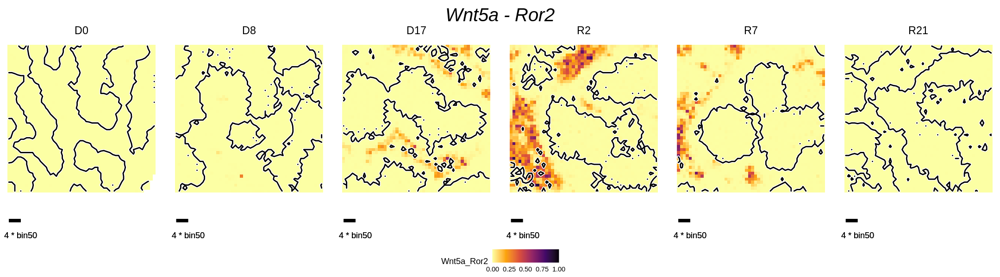

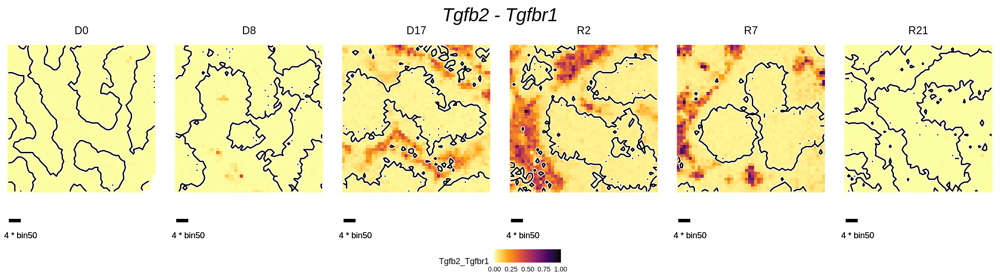

In [680]:
selected_LR <- c("Postn_Egfr", "Igf2_Igf2r", "Sfrp1_Fzd2", "Wnt5a_Ror2", "Tgfb2_Tgfbr1")
selected_LR <- strsplit(selected_LR, split = ", ") %>% unlist

# Show the result
options(repr.plot.width = 18, repr.plot.height = 5)
options(warn = -1)
for ( i in selected_LR) {
    p <- MagicMeSubLR(LR = i, obj = lr_local, magic = magic_lr, lines = TRUE, facet = TRUE, rescale = TRUE)
    print(p)
}
options(warn = 0)

In [8]:
LineGen <- function(obj, features, slot = "counts", isMeta = FALSE) {
    times <- c("D0", "D8", "D17", "R2", "R7", "R21")
    
    obj$is <- paste0( obj$time, "_layer_", obj$rank)
    obj$is <- factor(obj$is, levels = paste0(rep(times, each = 9), "_layer_", rep(c(1:9), times = 6)))
    
    # Meta or not
    if (isMeta) {
        df <- obj@meta.data[, c("is", features)] %>% group_by(is) %>% summarise_all(.funs = mean) %>% as.data.frame()
        rownames(df) <- df$is; df$is <- NULL
        df <- t(df)
    } else {
        # Counter by layer
        df <- Seurat::AverageExpression(obj, slot = slot, assays = "RNA", features = features, group.by = "is")$RNA
    }
    anno_col <- data.frame(time = rep(times, each = 9)); rownames(anno_col) <- colnames(df)

    
    df <- as.data.frame(t(df))
    df$time <- anno_col[rownames(df), "time"]
    df$id <- rownames(df)
    
    df <- reshape2::melt(df)
    df$time <- factor(df$time, levels = times)
    df$layer <- lapply(strsplit(df$id, split = "_"), function(x) {x[3]}) %>% unlist %>% as.integer() %>% factor()
    
    return(df)
}

In [709]:
magic_LR_obj <- CreateSeuratObject(counts = t(Matrix::as.matrix(magic_lr$matrix)), meta.data = sp@meta.data)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 4.0 GiB”
Warning message in CreateSeuratObject.default(counts = t(Matrix::as.matrix(magic_lr$matrix)), :
“Some cells in meta.data not present in provided counts matrix”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Using time, id as id variables



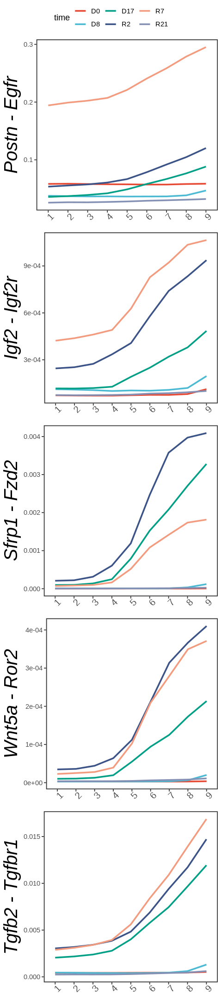

In [717]:
to_plot <- c("Postn-Egfr", "Igf2-Igf2r", "Sfrp1-Fzd2", "Wnt5a-Ror2", "Tgfb2-Tgfbr1")
t <- LineGen(magic_LR_obj, features = to_plot)

# line_pal <- colorRampPalette(c("purple", "black", "green"))(6)
line_pal <- c("#e64a35", "#4dbad4", "#009f86", "#3b5387", "#f39b7e", "#8491b4")
names(line_pal) <- c("D0", "D8", "D17", "R2", "R7", "R21")

p_list <- list()
for ( f in to_plot ) {
    p <- ggplot(dplyr::filter(t, variable == f), aes(layer, value)) +
    geom_line(aes(group = time, color = time), size = 1) + 
    labs(x = NULL, y = gsub("-", " - ", f), title = NULL) +
    scale_color_manual(values = line_pal) +
    theme_bw(base_rect_size = 1) +
    theme(axis.text.x = element_text(angle = 45, size = 12), axis.title.y = element_text(hjust = 0.5, face = "italic", size = 24), legend.position = "bottom",
      panel.grid = element_blank(), 
      plot.title = element_text(hjust = 0.5, face = "italic"))
    
    p_list[[f]] <- p
}

options(repr.plot.width = 4, repr.plot.height = 18)
ggpubr::ggarrange(plotlist = p_list, ncol = 1, common.legend = TRUE)

## 6f

In [682]:
magic_withAtoh8 <- readRDS("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220820_magic_selected_genes/20220820_magic_selected_genes.rds")

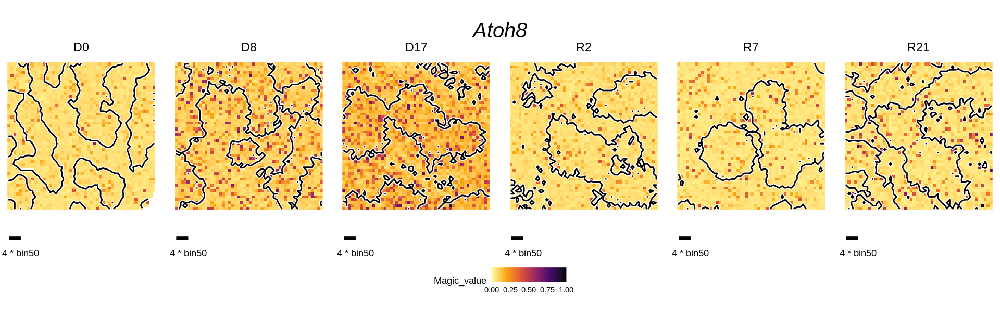

In [685]:
options(repr.plot.width = 16, repr.plot.height = 5)

MagicMeSub("Atoh8", lr_local, magic_withAtoh8$result, lines = TRUE, facet = TRUE, rescale = TRUE) + 
    theme(strip.text = element_text(size = 14))

Using time, id as id variables



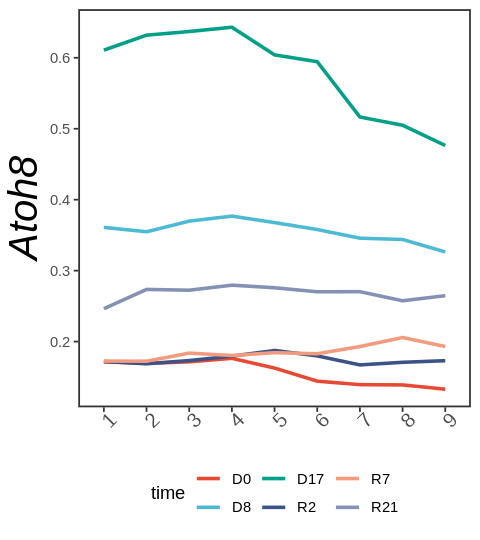

In [9]:
options(repr.plot.width = 4, repr.plot.height = 4.5)
p_list[["Atoh8"]]

## 6e

In [14]:
times <- c("D0", "D8", "D17", "R2", "R7", "R21")

# Load SCENIC output AUC matrix
df <- data.table::fread("/sibcb1/huilijianlab1/tuxinyi/BGI/DDC_spatial_data/20220503_spatial_sampler_senic/auc_mtx.csv",stringsAsFactors = TRUE) %>% as.data.frame()
rownames(df) <- df[,1]
df <- df[,-1]

meta <- sp@meta.data[ rownames(sp@meta.data) %in% rownames(df),]
meta$is <- paste0(meta$time, "_layer_", meta$rank)
meta$is <- factor(meta$is, levels = paste0(rep(times, each = 9), "_layer_", rep(c(1:9), times = 6)))
df <- cbind( meta[ rownames(df), c("is"), drop = FALSE], df)

mtx <- df %>% group_by(is) %>% summarise_all(.funs = mean) %>% as.data.frame()
rownames(mtx) <- mtx$is
mtx$is <- NULL
mtx <- t(mtx)

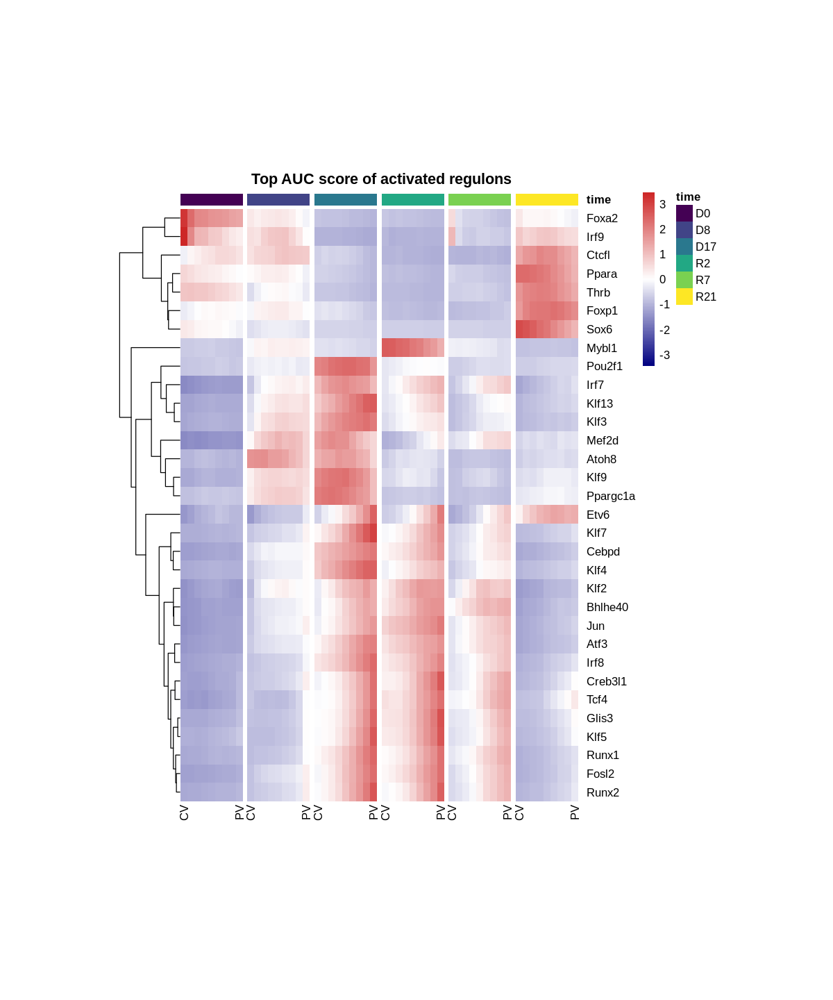

In [16]:
options(repr.plot.width =10, repr.plot.height = 12)

annotation_col <- data.frame(row.names = colnames(mtx), time = rep(c("D0", "D8", "D17", "R2", "R7", "R21"), each = 9))
annotation_col$time <- factor(annotation_col$time, levels = c("D0", "D8", "D17", "R2", "R7", "R21"))
rownames(mtx) <- gsub("_[(+)]*", "", rownames(mtx))

ann_colors <- list(time = viridisLite::viridis(n = 6))
names(ann_colors$time) <- c("D0", "D8", "D17", "R2", "R7", "R21")

ph <- pheatmap::pheatmap(mtx, show_rownames = T, angle_col = 90,
                   cluster_cols = F, scale = "row", 
                   gaps_col = c(1:6) * 9, 
                   labels_col = rep(c("CV", rep("", 7),"PV"), 6), 
                   color = colorRampPalette(c("navy", "white", "firebrick3"))(200), border_color = NA,
                   annotation_col = annotation_col,
                   annotation_colors = ann_colors,
                   cellheight = 16, cellwidth = 6, fontsize = 10, main = "Top AUC score of activated regulons"
                  )